# AOS_segmentation: rotate phosim  DM-30367

https://jira.lsstcorp.org/browse/DM-30367

Update segmentation and focalplanelayout to remove the rotational offset

Before: 
- made segmentation.txt and focalplanelayout.txt with 


    update_segmentation_comcam.py 
    update_segmentation_lsst.py
    update_focalplanelayout_comcam.py
    update_focalplanelayout_lsst.py 
    
- the problem is that these require to change ROTANG from phosim_ROTANG to  90-phosim_ROTANG to match the WCS 


After:
- changed some lines to allow to choose whether to derotate or not. Keep it explicit to make it easier to revert to previous version. Added `derotate_phosim` argument 




I first ensure that the result of running 

    update_segmentation_comcam.txt
    update_focalplanelayout_comcam.txt
     
    with derotate_phosim = False is exactly the same as what was on phosim_syseng4 master:
        
    # set derotate_phosim = False
    
    eg. 
    
    diff segmentation_DM-29264.txt segmentation.txt 
    
    and 
    
    diff focalplanelayout_DM-29264.txt focalplanelayout.txt 
    
show that there is no difference between these files.



# Before: comcam 

Try running quick image before - it was done in `AOS_letter_simulate.ipynb` : 

    ssh scichris@lsst-login01.ncsa.illinois.edu 
    ssh lsst-devl03 
    source "/software/lsstsw/stack/loadLSST.bash"    # need that for python 
    setup lsst_distrib 
    
    
    cd /project/scichris/aos/images/comCam

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/comCam/R22_letterF.inst -i comcam -e 1 -c /project/scichris/aos/images/comCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/comCam/letter/raw/ > starPhoSimLetter.log 2>&1
    
    setup phosim_utils -r /project/scichris/aos/phosim_utils/

    phosim_repackager.py /project/scichris/aos/images/comCam/letter/raw/ --out_dir /project/scichris/aos/images/comCam/letter/repackaged/ --inst comcam 
    
    
    

In [ ]:
import numpy as np
import pandas as pd 
# show the input instance catalog made with sky sim 

# read in the input instance catalog 
cat = np.genfromtxt('/project/scichris/aos/images/comCam/R22_letterF.inst',
                        skip_header=16)

cat_df = pd.DataFrame(cat[:, 1:5], columns=['id', 'ra', 'dec', 'g'])

import matplotlib.pyplot as plt

from matplotlib import rcParams 
rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18


# center around 0 to show the input : 
ra = cat_df['ra']
ra[ra>180] = ra[ra>180]-360
plt.scatter(ra,cat_df['dec'])



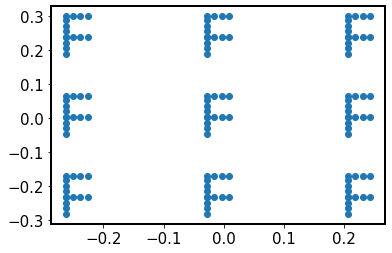

In [1]:
# show the postISR image 
from lsst.daf import butler as dafButler
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval
zscale = ZScaleInterval()

instrument = 'LSSTComCam'
repo_dir = '/project/scichris/aos/images/comCam/letter/DATA/'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded'],
                             )

dataId0 = dict(instrument=instrument)
dataset = next(iter(
                        butler.registry.queryDatasets(
                            datasetType='postISRCCD', 
                            collections=['run1'],
                            dataId=dataId0  )
                        )
                   )

expN = dataset.dataId["exposure"]

In [3]:
for amp in detector:
    bbox = amp.getBBox()
    print(amp.getName(), bbox.getCenterX(), bbox.getCenterY())

C10 254.0 2999.5
C11 763.0 2999.5
C12 1272.0 2999.5
C13 1781.0 2999.5
C14 2290.0 2999.5
C15 2799.0 2999.5
C16 3308.0 2999.5
C17 3817.0 2999.5
C07 3817.0 999.5
C06 3308.0 999.5
C05 2799.0 999.5
C04 2290.0 999.5
C03 1781.0 999.5
C02 1272.0 999.5
C01 763.0 999.5
C00 254.0 999.5


Text(0.5, 1.0, 'LSSTComCam, R22_S02 (ITL)')

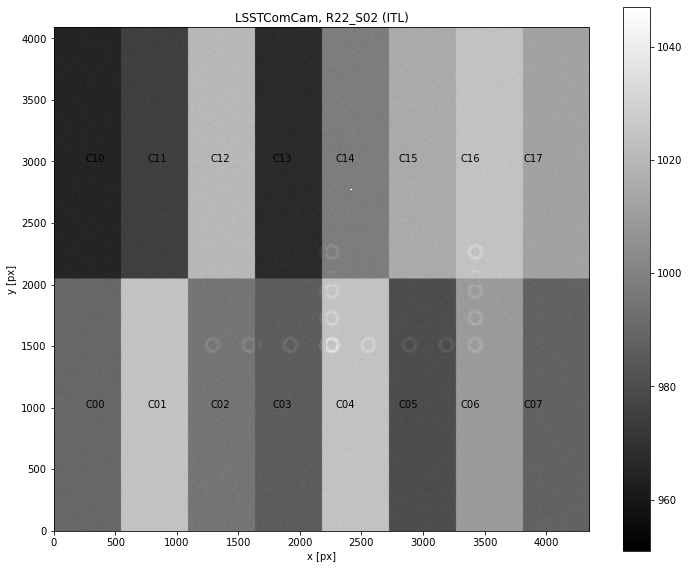

In [4]:
exposure = butler.get('raw', detector="R22_S02", instrument=instrument,
              exposure=expN, )


detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

for amp in detector:
    bbox = amp.getBBox()
    #print(amp.getName(), bbox.getCenterX(), bbox.getCenterY())
    plt.text(bbox.getCenterX(), bbox.getCenterY(), amp.getName())
plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')

Text(0.5, 1.0, 'LSSTComCam, R22_S02 (ITL)')

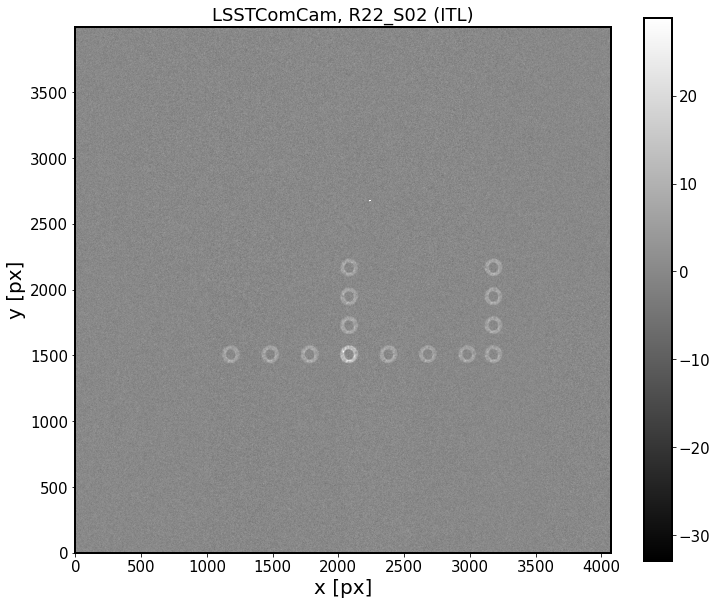

In [23]:

exposure = butler.get('postISRCCD', detector='R22_S02', 
                      instrument=instrument,exposure=expN,
          collections=['run1'])
detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')

# After: comcam

    cd /home/scichris/notebooks/

run with derotate_phosim = True (later can make it into an argparse arg...)

    python update_segmentation_comcam.txt
    python update_focalplanelayout_comcam.txt


Copy the files (I can always replace them back with focalplanelayout_DM-29264.txt and segmentation_DM-29264.txt since I've shown that they are identical )

    cd /project/scichris/aos/phosim_syseng4/data/comcam/
    cp focalplanelayout_DM-30367.txt focalplanelayout.txt  
    segmentation_DM-30367.txt segmentation.txt


Run the simulation : 
    
    cd 
    
    ssh scichris@lsst-login01.ncsa.illinois.edu 
    ssh lsst-devl02
    screen -x pert 

    
    cd /project/scichris/aos/images/comCam
    mkdir letter_derotate/raw/

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/comCam/R22_letterF.inst -i comcam -e 1 -c /project/scichris/aos/images/comCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/comCam/letter_derotate/raw/ > starPhoSimLetter.log 2>&1
    
    phosim_repackager.py /project/scichris/aos/images/comCam/letter_derotate/raw/ --out_dir /project/scichris/aos/images/comCam/letter_derotate/repackaged/ --inst comcam 
    
    cp ../letter/runIsr.sh .
    cp ../letter/testPipeline.yaml .
    
    ./runIsr.sh  (fails...)

Text(0.5, 1.0, 'LSSTComCam, R22_S02 (ITL)')

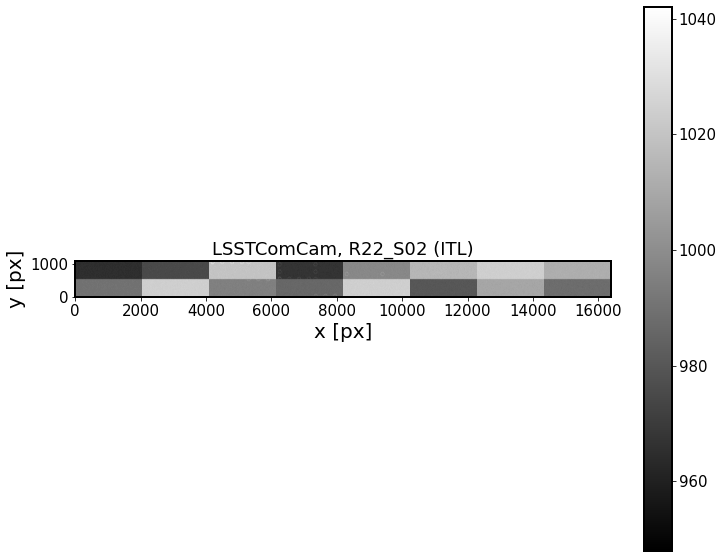

In [25]:
# show the raw image 
from lsst.daf import butler as dafButler
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval
zscale = ZScaleInterval()

instrument = 'LSSTComCam'
repo_dir = '/project/scichris/aos/images/comCam/letter_derotate/DATA/'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded'],
                             )
        
dataId0 = dict(instrument=instrument)
dataset = next(iter(butler.registry.queryDatasets(
                    datasetType='raw',
                    dataId=dataId0  )))

expN = dataset.dataId["exposure"]

exposure = butler.get('raw', detector="R22_S02", instrument=instrument,
              exposure=expN,)


detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')

Text(0.5, 1.0, 'LSSTComCam, R22_S01 (ITL)')

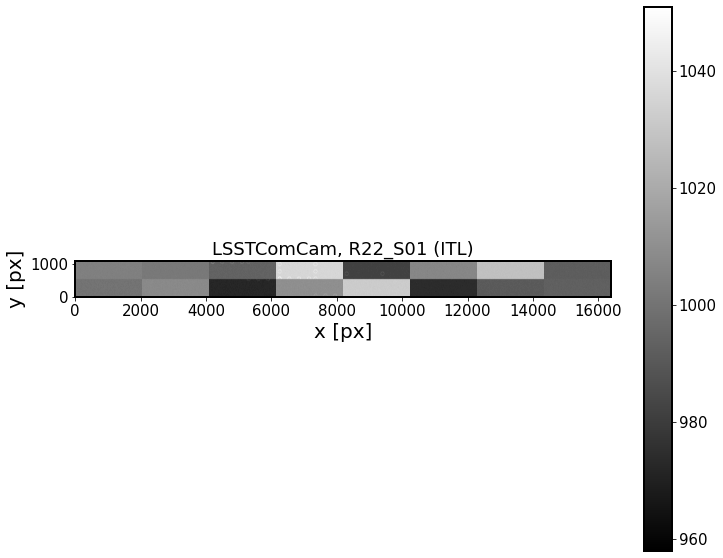

In [26]:
exposure = butler.get('raw', detector="R22_S01", instrument=instrument,
              exposure=expN,)


detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')

In [ ]:
??? Why is it so narrow ??? 

## Change the Euler angle 

Try changing the first of the Euler angles... (?)  - perhaps  I misunderstand something about how it's done...

RHL said "I can give you the position of the centre of the detector in mm in the focal plane, and the rotation about three axes -- those'll be your Euler angles.  In the plane of the device they're currently always 0.0 (although you can query them)."

In [2]:
import lsst.geom as geom
import lsst.afw.cameraGeom as cameraGeom
from lsst.obs.lsst import LsstComCam
camera = LsstComCam().getCamera()
for detector in camera:
    bbox = detector.getBBox()
    xp, yp = detector.getCenter(cameraGeom.FOCAL_PLANE)  # centre of CCD
    yaw = detector.getOrientation().getYaw().asDegrees()  # rotation in the plane of the camera  
    #(also getPitch() and getRoll(); see afw/cameraGeom/Orientation.h)
    #pitch = detector.getOrientation(). 
    #roll 
    print(f"{detector.getName():10} ({xp:9.4f}, {yp:9.4f}) mm  {yaw} deg")

R22_S00    ( -42.2600,  -42.2600) mm  0.0 deg
R22_S01    (  -0.0100,  -42.2600) mm  0.0 deg
R22_S02    (  42.2400,  -42.2600) mm  0.0 deg
R22_S10    ( -42.2600,   -0.0100) mm  0.0 deg
R22_S11    (  -0.0100,   -0.0100) mm  0.0 deg
R22_S12    (  42.2400,   -0.0100) mm  0.0 deg
R22_S20    ( -42.2600,   42.2400) mm  0.0 deg
R22_S21    (  -0.0100,   42.2400) mm  0.0 deg
R22_S22    (  42.2400,   42.2400) mm  0.0 deg


In [8]:
import updatePhosimFunctions as up

In [10]:
headerLines, contentLines = up.readFile('/project/scichris/aos/phosim_syseng4/data/comcam/focalplanelayout_old.txt')


In [11]:
line = contentLines[3]

In [13]:
splitContent = line.split()

In [16]:
splitContent[11]

'Group1'

In [17]:
eulerAngle1 = float(splitContent[12])

In [19]:
eulerAngle1

-0.004927

In [20]:
newEulerAngle1 = eulerAngle1+90

**NB: this is done in `focalplanelayout.txt`**

Run simulation and see the result : 


    ssh scichris@lsst-login01.ncsa.illinois.edu 
    ssh lsst-devl02
    screen -x pert 

    
    cd /project/scichris/aos/images/comCam
    mkdir letter_euler/raw/

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/comCam/R22_letterF.inst -i comcam -e 1 -c /project/scichris/aos/images/comCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/comCam/letter_euler/raw/ > starPhoSimLetter.log 2>&1
    
    phosim_repackager.py /project/scichris/aos/images/comCam/letter_euler/raw/ --out_dir /project/scichris/aos/images/comCam/letter_euler/repackaged/ --inst comcam 
    
    cp ../letter/runIsr.sh .
    cp ../letter/testPipeline.yaml .
    
    ./runIsr.sh  (doesn't fail! :) 

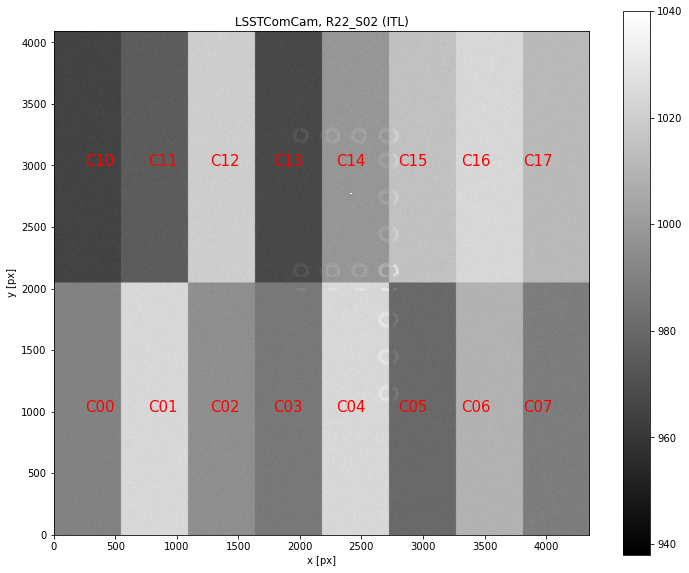

In [6]:
# show the raw image 
from lsst.daf import butler as dafButler
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval
zscale = ZScaleInterval()

instrument = 'LSSTComCam'
repo_dir = '/project/scichris/aos/images/comCam/letter_euler/DATA/'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded'],
                             )
        
dataId0 = dict(instrument=instrument)
dataset = next(iter(butler.registry.queryDatasets(
                    datasetType='raw',
                    dataId=dataId0  )))

expN = dataset.dataId["exposure"]

exposure = butler.get('raw', detector="R22_S02", instrument=instrument,
              exposure=expN,)


detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')

for amp in detector:
    bbox = amp.getBBox()
    plt.text(bbox.getCenterX(), bbox.getCenterY(), amp.getName(), 
             fontsize=15, color='red')
    

In [7]:
for amp in detector:
    print(amp.getName(), amp.getBBox(), amp.getRawBBox(), amp.getRawFlipX(), amp.getRawFlipY())

C10 (minimum=(0, 2000), maximum=(508, 3999)) (minimum=(0, 2048), maximum=(543, 4095)) False False
C11 (minimum=(509, 2000), maximum=(1017, 3999)) (minimum=(544, 2048), maximum=(1087, 4095)) False False
C12 (minimum=(1018, 2000), maximum=(1526, 3999)) (minimum=(1088, 2048), maximum=(1631, 4095)) False False
C13 (minimum=(1527, 2000), maximum=(2035, 3999)) (minimum=(1632, 2048), maximum=(2175, 4095)) False False
C14 (minimum=(2036, 2000), maximum=(2544, 3999)) (minimum=(2176, 2048), maximum=(2719, 4095)) False False
C15 (minimum=(2545, 2000), maximum=(3053, 3999)) (minimum=(2720, 2048), maximum=(3263, 4095)) False False
C16 (minimum=(3054, 2000), maximum=(3562, 3999)) (minimum=(3264, 2048), maximum=(3807, 4095)) False False
C17 (minimum=(3563, 2000), maximum=(4071, 3999)) (minimum=(3808, 2048), maximum=(4351, 4095)) False False
C07 (minimum=(3563, 0), maximum=(4071, 1999)) (minimum=(3808, 0), maximum=(4351, 2047)) False False
C06 (minimum=(3054, 0), maximum=(3562, 1999)) (minimum=(3264, 

In [15]:
for amp in detector:
    bbox = amp.getBBox()
    print(amp.getName(), bbox.getCenterX(), bbox.getCenterY())

C10 254.0 2999.5
C11 763.0 2999.5
C12 1272.0 2999.5
C13 1781.0 2999.5
C14 2290.0 2999.5
C15 2799.0 2999.5
C16 3308.0 2999.5
C17 3817.0 2999.5
C07 3817.0 999.5
C06 3308.0 999.5
C05 2799.0 999.5
C04 2290.0 999.5
C03 1781.0 999.5
C02 1272.0 999.5
C01 763.0 999.5
C00 254.0 999.5


In [14]:
bbox.getCenterX()
bbox.getCenterY()

999.5

Text(0.5, 1.0, 'LSSTComCam, R22_S02 (ITL)')

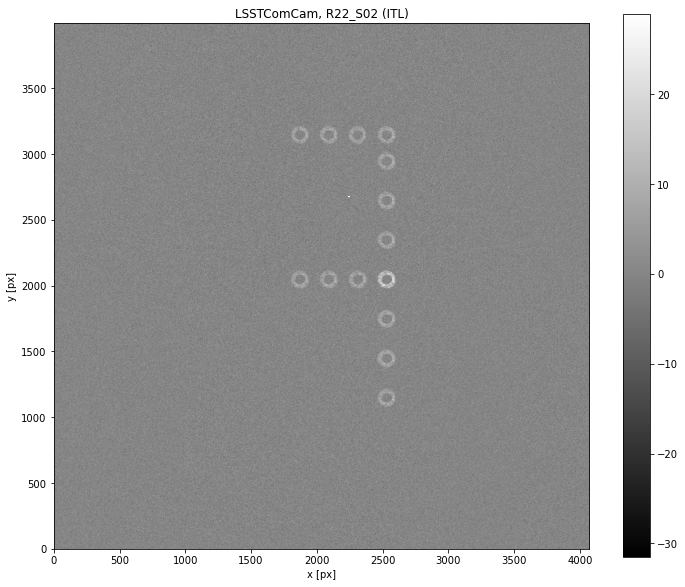

In [22]:
exposure = butler.get('postISRCCD', detector='R22_S02', 
                      instrument=instrument,exposure=expN,
          collections=['run1'])
detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')

## Try also changing the serial read direction (in **`segmentation.txt`**)

In [6]:
from lsst.obs.lsst import LsstComCam
camera = LsstComCam().getCamera()

for detector in camera:
    print(detector.getName(),detector.getPhysicalType())

R22_S00 ITL
R22_S01 ITL
R22_S02 ITL
R22_S10 ITL
R22_S11 ITL
R22_S12 ITL
R22_S20 ITL
R22_S21 ITL
R22_S22 ITL


I don't know if it makes sense, but  I changed it to `-1` for all chips (flag `change_serial`) ... It was `1`... 

Run the simulation: 
    
    
    
    ssh scichris@lsst-login01.ncsa.illinois.edu 
    ssh lsst-devl02
    screen -x pert 

    cp segmentation_DM-29264.txt segmentation.txt 
    
    cd /project/scichris/aos/images/comCam
    mkdir letter_serial
    mkdir letter_serial/raw/

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/comCam/R22_letterF.inst -i comcam -e 1 -s R22_S02 -c /project/scichris/aos/images/comCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/comCam/letter_serial/raw/ > starPhoSimLetter.log 2>&1
    
    phosim_repackager.py /project/scichris/aos/images/comCam/letter_serial/raw/ --out_dir /project/scichris/aos/images/comCam/letter_serial/repackaged/ --inst comcam 
    
    cp ../letter/runIsr.sh .
    cp ../letter/testPipeline.yaml .
    
    ./runIsr.sh  (fails...)

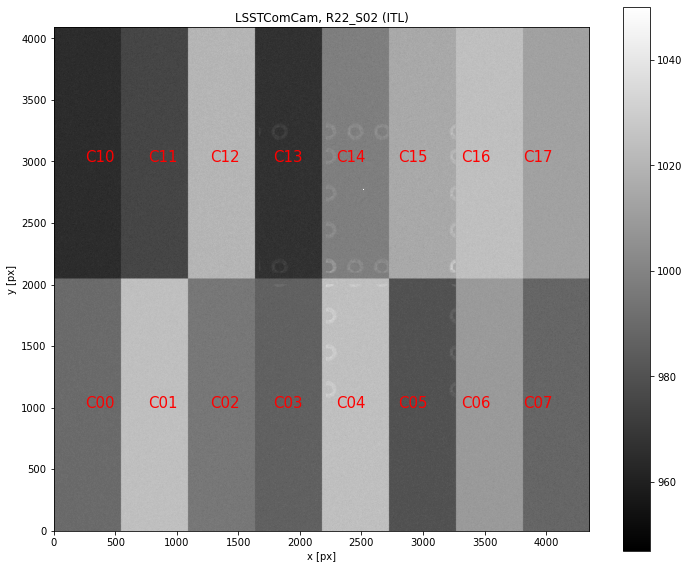

In [1]:
# show the raw image 
from lsst.daf import butler as dafButler
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval
zscale = ZScaleInterval()

instrument = 'LSSTComCam'
repo_dir = '/project/scichris/aos/images/comCam/letter_serial/DATA/'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded'],
                             )
        
dataId0 = dict(instrument=instrument)
dataset = next(iter(butler.registry.queryDatasets(
                    datasetType='raw',
                    dataId=dataId0  )))

expN = dataset.dataId["exposure"]

# exposure = butler.get('postISRCCD', detector='R22_S02', 
#                       instrument=instrument,exposure=expN,
#           collections=['run1'])

exposure = butler.get('raw', detector="R22_S02", instrument=instrument,
              exposure=expN,)


detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')

for amp in detector:
    bbox = amp.getBBox()
    plt.text(bbox.getCenterX(), bbox.getCenterY(), amp.getName(), 
             fontsize=15, color='red')

## Also remap top amps making left-right flip: 10,11,12... --> 17,16,15...

Changed 10,11,12... --> 17,16,15 ... manually for R22_S22 ....  Then it would treat 17 as if it were in a location of 10, etc... 
     
    ssh scichris@lsst-login01.ncsa.illinois.edu 
    ssh lsst-devl01
    
    screen -S aos    # made a new screen 
    source "/software/lsstsw/stack/loadLSST.bash"    # need that for python 
    setup lsst_distrib 
    setup phosim_utils -r /project/scichris/aos/phosim_utils/

    # manually edited  segmentation.txt  for R22_S22 ... 
    
    cd /project/scichris/aos/images/comCam
    mkdir letter_serial_edit
    mkdir letter_serial_edit/raw/
     
    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/comCam/R22_letterF.inst -i comcam -e 1 -s R22_S22 -c /project/scichris/aos/images/comCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/comCam/letter_serial_edit/raw/ > starPhoSimLetter.log 2>&1
    
    phosim_repackager.py /project/scichris/aos/images/comCam/letter_serial_edit/raw/ --out_dir /project/scichris/aos/images/comCam/letter_serial_edit/repackaged/ --inst comcam 
    
    cd letter_serial_edit
    cp ../letter/runIsr.sh .
    cp ../letter/testPipeline.yaml .
    
    ./runIsr.sh



Text(0.5, 1.0, 'LSSTComCam, R22_S22 (ITL)')

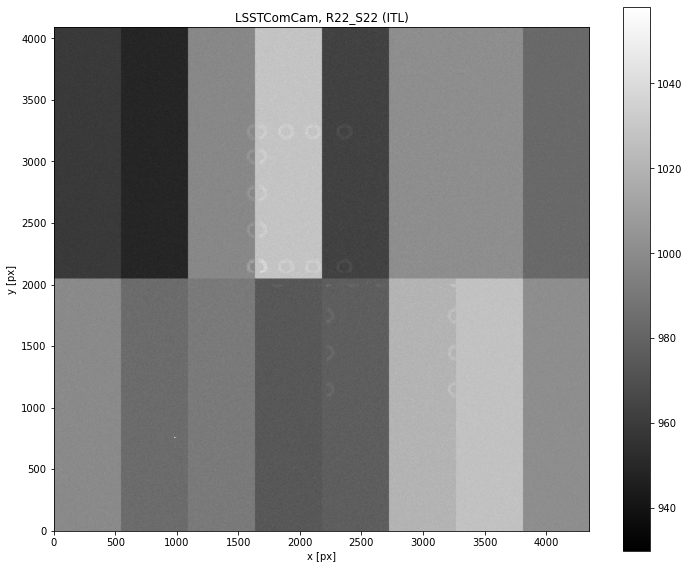

In [8]:
# show the raw image 
from lsst.daf import butler as dafButler
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval
zscale = ZScaleInterval()

instrument = 'LSSTComCam'
repo_dir = '/project/scichris/aos/images/comCam/letter_serial_edit/DATA/'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded'],
                             )
        
dataId0 = dict(instrument=instrument)
dataset = next(iter(butler.registry.queryDatasets(
                    datasetType='raw',
                    dataId=dataId0  )))

expN = dataset.dataId["exposure"]

# exposure = butler.get('postISRCCD', detector='R22_S02', 
#                       instrument=instrument,exposure=expN,
#           collections=['run1'])

exposure = butler.get('raw', detector="R22_S22", instrument=instrument,
              exposure=expN,)


detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')

show that the ISR used correct gains ... 

Text(0.5, 1.0, 'LSSTComCam, R22_S22 (ITL)')

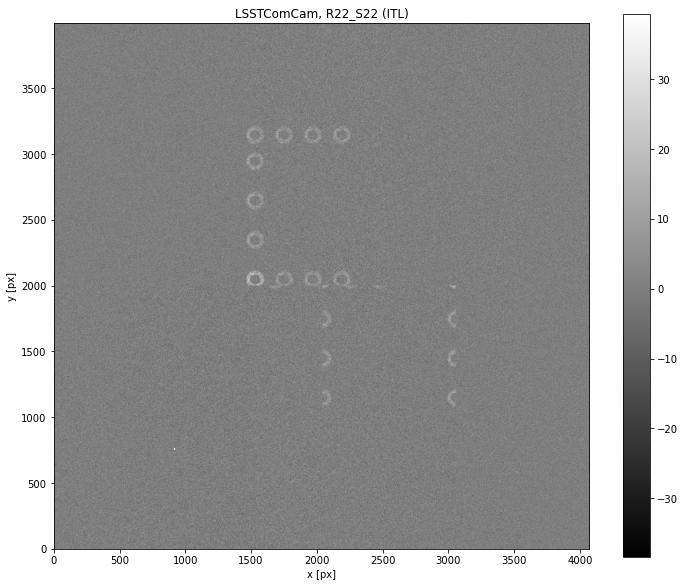

In [9]:
exposure = butler.get('postISRCCD', detector='R22_S22', 
                      instrument=instrument,exposure=expN,
          collections=['run1'])
detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')

## Remap left-right the bottom row of amplifiers: 00,01,02.... --> 07, 06, 05

ok, manually change also 00,01,02.... --> 07, 06, 05 .... (for R22_S22 ) 




    mkdir letter_serial_edit2
    mkdir letter_serial_edit2/raw/
     
    cd letter_serial_edit2
    
    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/comCam/R22_letterF.inst -i comcam -e 1 -s R22_S22 -c /project/scichris/aos/images/comCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/comCam/letter_serial_edit2/raw/ > starPhoSimLetter.log 2>&1
    
    phosim_repackager.py /project/scichris/aos/images/comCam/letter_serial_edit2/raw/ --out_dir /project/scichris/aos/images/comCam/letter_serial_edit2/repackaged/ --inst comcam 
    
    
    cp ../letter/runIsr.sh .
    cp ../letter/testPipeline.yaml .
    
    ./runIsr.sh

Show the result - it should have the correct orientation and be ISRd properly ...

Text(0.5, 1.0, 'LSSTComCam, R22_S22 (ITL)')

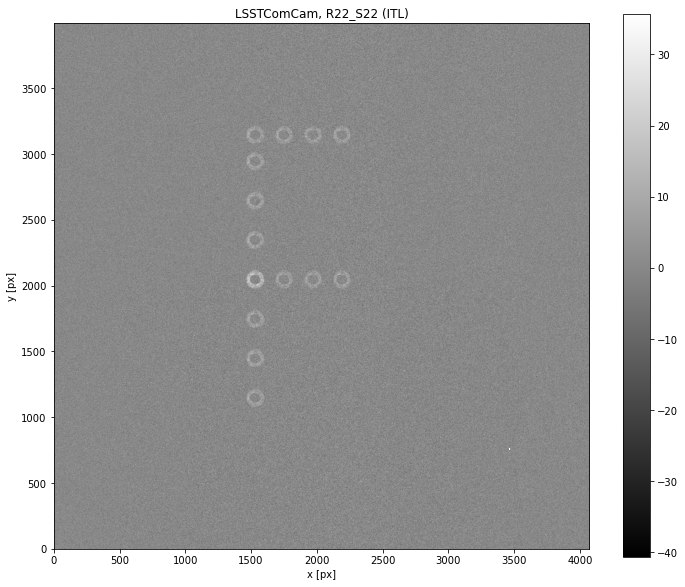

In [2]:
instrument = 'LSSTComCam'
repo_dir = '/project/scichris/aos/images/comCam/letter_serial_edit2/DATA/'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded'],
                             )
        
dataId0 = dict(instrument=instrument)
dataset = next(iter(butler.registry.queryDatasets(
                    datasetType='raw',
                    dataId=dataId0  )))

expN = dataset.dataId["exposure"]

exposure = butler.get('postISRCCD', detector='R22_S22', 
                      instrument=instrument,exposure=expN,
          collections=['run1'])
detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')

# Test the WCS ...

In [13]:
exposure.getWcs()

FITS standard SkyWcs:
Sky Origin: (0.0000000000, +0.0000000000)
Pixel Origin: (-2188.5, -2224.5)
Pixel Scale: 0.2 arcsec/pixel

Text(0.5, 1.0, 'LSSTComCam, R22_S22 (ITL)')

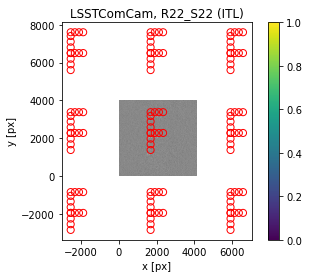

In [63]:
import numpy as np
import pandas as pd 
# show the input instance catalog made with sky sim 

# read in the input instance catalog 
cat = np.genfromtxt('/project/scichris/aos/images/comCam/R22_letterF.inst',
                        skip_header=16)

cat_df = pd.DataFrame(cat[:, 1:5], columns=['id', 'ra', 'dec', 'g'])


# get the wcs 
wcs = exposure.getWcs()

# calculate the position given the x,y 
#y,x = wcs.skyToPixelArray(cat_df['ra'], cat_df['dec'],degrees=True)


x,y = newWcs.skyToPixelArray(cat_df['ra'], cat_df['dec'], degrees=True)

# plot the x,y CCD pixel position derived from WCS
# given the input ra,dec catalog... 
plt.imshow(data, origin='lower', vmin=vmin, vmax=vmax,cmap='gray')
plt.scatter(x,y,  facecolors='none', edgecolors='r', marker='o', s=50, )
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')

In [22]:
wcs = exposure.getWcs()

In [23]:
wcs.getCdMatrix

FITS standard SkyWcs:
Sky Origin: (0.0000000000, +0.0000000000)
Pixel Origin: (-2188.5, -2224.5)
Pixel Scale: 0.2 arcsec/pixel

In [30]:
wcs.getPixelScale

<bound method PyCapsule.getPixelScale of FITS standard SkyWcs:
Sky Origin: (0.0000000000, +0.0000000000)
Pixel Origin: (-2188.5, -2224.5)
Pixel Scale: 0.2 arcsec/pixel>

In [21]:
exposure.setWcs

<bound method PyCapsule.setWcs of <lsst.afw.image.exposure.ExposureF object at 0x7fc999314530>>

In [17]:
wcs.getCdMatrix()

array([[-3.40179666e-21,  5.55555556e-05],
       [ 5.55555556e-05,  3.40179666e-21]])

In [26]:
makeSkyWcs??

Docstring:
makeSkyWcs(*args, **kwargs)
Overloaded function.

1. makeSkyWcs(crpix: lsst.geom.Point2D, crval: lsst.geom.SpherePoint, cdMatrix: numpy.ndarray[numpy.float64[2, 2]], projection: str = 'TAN') -> lsst.afw.geom.SkyWcs

2. makeSkyWcs(metadata: lsst.daf.base.propertyContainer.propertySet.PropertySet, strip: bool = False) -> lsst.afw.geom.SkyWcs

3. makeSkyWcs(pixelsToFieldAngle: lsst.afw.geom.TransformPoint2ToPoint2, orientation: lsst.geom.Angle, flipX: bool, boresight: lsst.geom.SpherePoint, projection: str = 'TAN') -> lsst.afw.geom.SkyWcs
Type:      builtin_function_or_method


In [34]:
makeCdMatrix??

Docstring: makeCdMatrix(scale: lsst.geom.Angle, orientation: lsst.geom.Angle = 0 rad, flipX: bool = False) -> numpy.ndarray[numpy.float64[2, 2]]
Type:      builtin_function_or_method


In [62]:
import lsst.geom
from lsst.afw.geom import makeSkyWcs,  makeCdMatrix
orientation = 0 * lsst.geom.degrees  # 
flipX = True
scale =  0.2 * lsst.geom.arcseconds  # how many arcsec per pixel 
cdMatrix = makeCdMatrix(scale=scale, orientation=orientation, flipX=flipX)

# crval  - `lsst.geom.SpherePoint`  Desired reference sky position.
# crpix = lsst.geom.Point2D(100, 100) - pixel corresponding ot the origin 

crpix = lsst.geom.Point2D(2188.5, 2224.5)
crval = lsst.geom.SpherePoint(0.0*lsst.geom.degrees, 0.0*lsst.geom.degrees)
newWcs = makeSkyWcs(crpix=crpix, crval=crval, cdMatrix=cdMatrix)

In [39]:


makeSkyWcs??

Docstring:
makeSkyWcs(*args, **kwargs)
Overloaded function.

1. makeSkyWcs(crpix: lsst.geom.Point2D, crval: lsst.geom.SpherePoint, cdMatrix: numpy.ndarray[numpy.float64[2, 2]], projection: str = 'TAN') -> lsst.afw.geom.SkyWcs

2. makeSkyWcs(metadata: lsst.daf.base.propertyContainer.propertySet.PropertySet, strip: bool = False) -> lsst.afw.geom.SkyWcs

3. makeSkyWcs(pixelsToFieldAngle: lsst.afw.geom.TransformPoint2ToPoint2, orientation: lsst.geom.Angle, flipX: bool, boresight: lsst.geom.SpherePoint, projection: str = 'TAN') -> lsst.afw.geom.SkyWcs
Type:      builtin_function_or_method


In [42]:
wcs.getPixelOrigin()

Point2D(-2188.5, -2224.5)

In [43]:
wcs.getSkyOrigin()

SpherePoint(0.0*geom.degrees, 0.0*geom.degrees)

In [60]:
newWcs.getCdMatrix()

array([[-5.55555556e-05,  0.00000000e+00],
       [ 0.00000000e+00,  5.55555556e-05]])

In [53]:
wcs.getCdMatrix()

array([[-3.40179666e-21,  5.55555556e-05],
       [ 5.55555556e-05,  3.40179666e-21]])

# Simulate all sensors, using new `update_segmentation_comcam`, 

so that all comCam sensors have correct Euler rotation, serial, and channel names...

I first run that to update segmentation.txt (focalplanelayout.txt has already been updated... )
    
    python /home/scichris/notebooks/update_segmentation_comcam.py 
    cd /project/scichris/aos/phosim_syseng4/data/comcam
    cp segmentation_DM-29264.txt segmentation.txt 
    
    

Then I run this to run the phoSim simulation:


    source "/software/lsstsw/stack/loadLSST.bash"
    setup lsst_distrib
    
    source /project/scichris/aos/setup_aos_current.sh
    
    cd /project/scichris/aos/images/comCam/
    mkdir letter_serial_euler
    mkdir letter_serial_euler/raw/
     
    cd letter_serial_euler
    
    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/comCam/R22_letterF.inst -i comcam -e 1 -c /project/scichris/aos/images/comCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/comCam/letter_serial_euler/raw/ > starPhoSimLetter.log 2>&1
    
    phosim_repackager.py /project/scichris/aos/images/comCam/letter_serial_euler/raw/ --out_dir /project/scichris/aos/images/comCam/letter_serial_euler/repackaged/ --inst comcam 
    
    
    cp ../letter/runIsr.sh .
    cp ../letter/testPipeline.yaml .
    
    ./runIsr.sh

Text(0.5, 1.0, 'LSSTComCam, R22_S02 (ITL)')

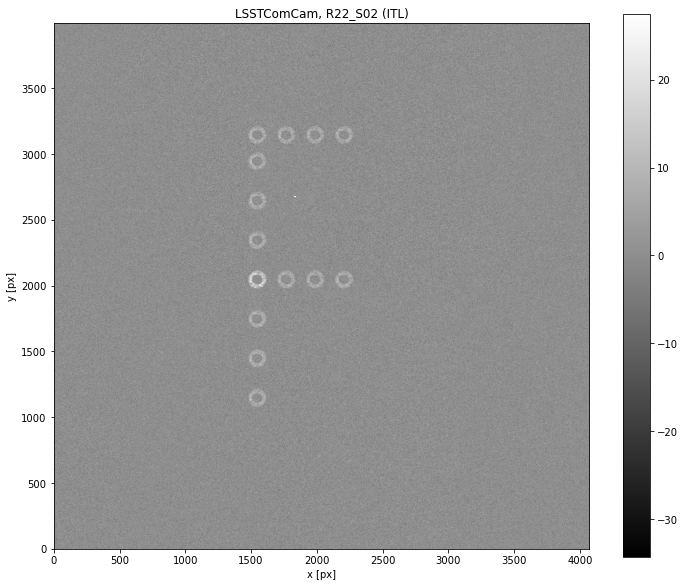

In [2]:
# show the raw image 
from lsst.daf import butler as dafButler
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval
zscale = ZScaleInterval()

instrument = 'LSSTComCam'
repo_dir = '/project/scichris/aos/images/comCam/letter_serial_euler/DATA/'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded'],
                             )
        
dataId0 = dict(instrument=instrument)
dataset = next(iter(butler.registry.queryDatasets(
                    datasetType='raw',
                    dataId=dataId0  )))

expN = dataset.dataId["exposure"]

exposure = butler.get('postISRCCD', detector='R22_S02', 
                      instrument=instrument,exposure=expN,
          collections=['run1'])
detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')

Plot all sensors with cameraGeomUtils 

In [100]:
from lsst.daf import butler as dafButler
import lsst.afw.cameraGeom.utils as cameraGeomUtils
import lsst.afw.display as afwDisplay
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval
import os 

afwDisplay.setDefaultBackend("matplotlib")

repo_dir = os.path.join('/project/scichris/aos/images/comCam/letter_serial_euler/DATA/')

# need to specify the calib collections to be able to access the camera 
instrument = 'LSSTComCam'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded']
                         )

dataId0 = dict(instrument=instrument)
dataset = next(iter(
                    butler.registry.queryDatasets(
                        datasetType='postISRCCD', 
                        collections=['run1'],
                        dataId=dataId0  )
                    )
               )

exposure = dataset.dataId["exposure"]

camera  = butler.get("camera", instrument=instrument, exposure=exposure)



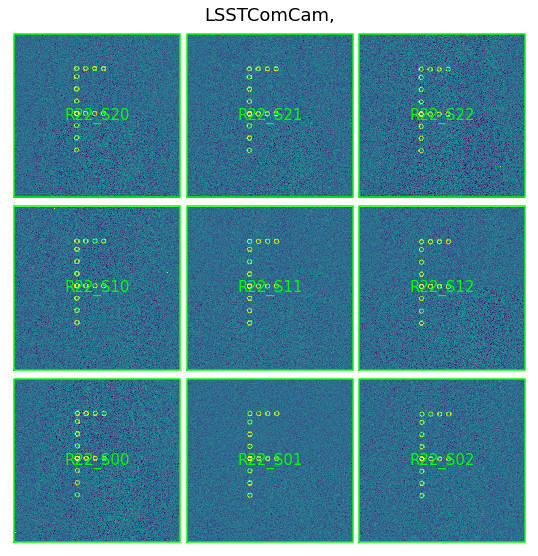

In [101]:
fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0., wspace=0.0, )

ax = fig.add_subplot(1, 1, 1)

disp = afwDisplay.Display(fig)
disp.scale('asinh', 'zscale', Q=2)
#disp.scale('linear', 'minmax')
#disp.scale('asinh', 5, 7000, Q=2)

disp.setImageColormap('viridis' if True else 'gray')
dataType = "postISRCCD"


# use that  to limit what's shown
#detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10']# , 'R34_S20'] 

# set to None to plot everything
detectorNameList = None
mos = cameraGeomUtils.showCamera(camera,
                             cameraGeomUtils.ButlerImage(butler, dataType, 
                                                         instrument=instrument, 
                                                         exposure=exposure,
                                                         verbose=True),
                             binSize=16, 
                             detectorNameList=detectorNameList, 
                             display=disp, overlay=True, title=f'{instrument},' )
                             
disp.show_colorbar(False)
ax.axis("off")

plt.savefig('LsstComCam_letter_serial_euler.png', bbox_inches='tight')

In [14]:
camera  = butler.get("camera", instrument=instrument, exposure=expN, 
                     )

In [21]:
exposures = {}

for detector in camera:
    print(detector.getName())
    exposure = butler.get('postISRCCD', 
                          detector=detector.getName(), 
                          instrument=instrument,
                          exposure=expN, 
                          collections=['run1']
                         )
    exposures[detector.getName()] = exposure

R22_S00
R22_S01
R22_S02
R22_S10
R22_S11
R22_S12
R22_S20
R22_S21
R22_S22


In [37]:
info = exposure.getInfo()
print(info.getDetector().getName())

R22_S22



 R22_S00 FITS standard SkyWcs:
Sky Origin: (0.0000000000, +0.0000000000)
Pixel Origin: (6261.5, 6225.5)
Pixel Scale: 0.2 arcsec/pixel

 R22_S01 FITS standard SkyWcs:
Sky Origin: (0.0000000000, +0.0000000000)
Pixel Origin: (2036.5, 6225.5)
Pixel Scale: 0.2 arcsec/pixel

 R22_S02 FITS standard SkyWcs:
Sky Origin: (0.0000000000, +0.0000000000)
Pixel Origin: (-2188.5, 6225.5)
Pixel Scale: 0.2 arcsec/pixel

 R22_S10 FITS standard SkyWcs:
Sky Origin: (0.0000000000, +0.0000000000)
Pixel Origin: (6261.5, 2000.5)
Pixel Scale: 0.2 arcsec/pixel

 R22_S11 FITS standard SkyWcs:
Sky Origin: (0.0000000000, +0.0000000000)
Pixel Origin: (2036.5, 2000.5)
Pixel Scale: 0.2 arcsec/pixel

 R22_S12 FITS standard SkyWcs:
Sky Origin: (0.0000000000, +0.0000000000)
Pixel Origin: (-2188.5, 2000.5)
Pixel Scale: 0.2 arcsec/pixel

 R22_S20 FITS standard SkyWcs:
Sky Origin: (0.0000000000, +0.0000000000)
Pixel Origin: (6261.5, -2224.5)
Pixel Scale: 0.2 arcsec/pixel

 R22_S21 FITS standard SkyWcs:
Sky Origin: (0.00000

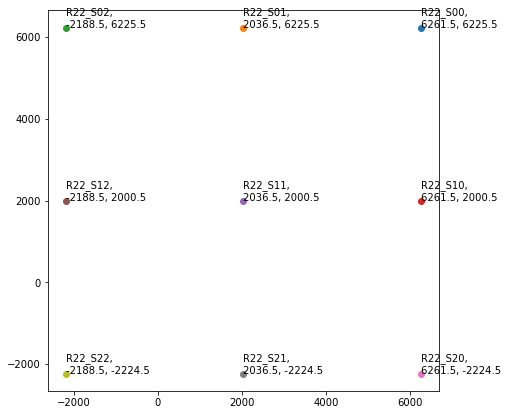

In [57]:
fig,ax = plt.subplots(1,1, figsize=(7,7))
for detector in exposures.keys():
    exposure = exposures[detector]
    name = exposure.getInfo().getDetector().getName()
    print('\n', name,
          exposure.getWcs())
    wcs = exposure.getWcs()
    x,y = wcs.getPixelOrigin()
    ax.scatter(x,y)
    ax.text(x,y,f'{name},\n{round(x,3)}, {y}')
#ax.set_xlims()

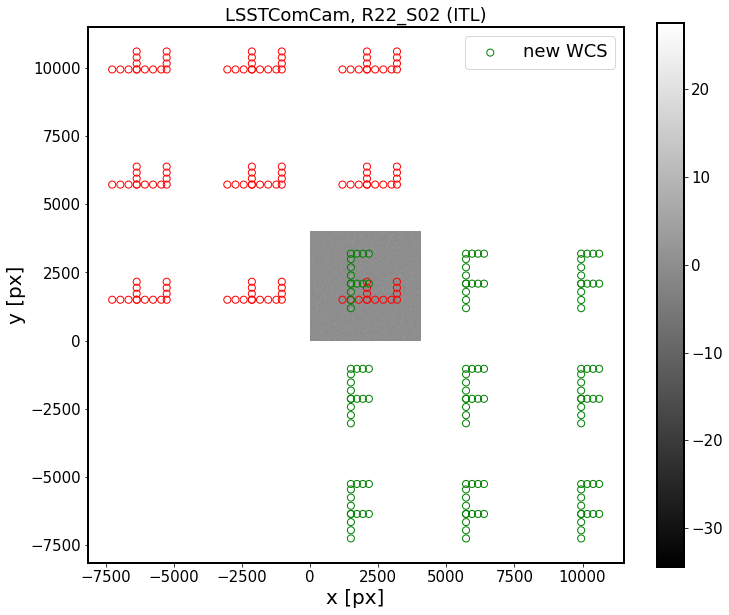

In [99]:
# show the raw image 
from lsst.daf import butler as dafButler
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval
zscale = ZScaleInterval()

instrument = 'LSSTComCam'
repo_dir = '/project/scichris/aos/images/comCam/letter_serial_euler/DATA/'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded'],
                             )
        
dataId0 = dict(instrument=instrument)
dataset = next(iter(butler.registry.queryDatasets(
                    datasetType='raw',
                    dataId=dataId0  )))

expN = dataset.dataId["exposure"]

exposure = butler.get('postISRCCD', detector='R22_S02', 
                      instrument=instrument,exposure=expN,
          collections=['run1'])
detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')


# read in the input instance catalog 
cat = np.genfromtxt('/project/scichris/aos/images/comCam/R22_letterF.inst',
                        skip_header=16)

cat_df = pd.DataFrame(cat[:, 1:5], columns=['id', 'ra', 'dec', 'g'])


# get the wcs 
wcs = exposure.getWcs()

# calculate the position given the x,y 
x,y= wcs.skyToPixelArray(cat_df['ra'], cat_df['dec'],degrees=True)

# plot the OLD WCS
plt.scatter(x,y,  facecolors='none', edgecolors='r', marker='o', s=50, label='old WCS')


# make new WCS 
import lsst.geom
from lsst.afw.geom import makeSkyWcs,  makeCdMatrix
orientation = 0 * lsst.geom.degrees  # 
flipX = True 
scale =  0.2 * lsst.geom.arcseconds  # how many arcsec per pixel 
cdMatrix = makeCdMatrix(scale=scale, orientation=orientation, flipX=flipX)

# crval  - `lsst.geom.SpherePoint`  Desired reference sky position.
# crpix = lsst.geom.Point2D(100, 100) - pixel corresponding ot the origin 
xPx,yPx = wcs.getPixelOrigin()
crpix = lsst.geom.Point2D(yPx, xPx)
crval = lsst.geom.SpherePoint(0.0*lsst.geom.degrees, 0.0*lsst.geom.degrees)
newWcs = makeSkyWcs(crpix=crpix, crval=crval, cdMatrix=cdMatrix)

# calculate the position  with new WCS given the x,y 
x,y = newWcs.skyToPixelArray(cat_df['ra'], cat_df['dec'],degrees=True)

# plot the new  WCS
plt.scatter(x,y,  facecolors='none', edgecolors='g', marker='o', s=50, label='new WCS')

plt.legend(fontsize=18)

In [45]:
source


-2224.5

Print the WCS information

In [ ]:
for detector in exposure = 

In [3]:
import numpy as np
import pandas as pd 
# show the input instance catalog made with sky sim 

# read in the input instance catalog 
cat = np.genfromtxt('/project/scichris/aos/images/comCam/R22_letterF.inst',
                        skip_header=16)

cat_df = pd.DataFrame(cat[:, 1:5], columns=['id', 'ra', 'dec', 'g'])


# get the wcs 
wcs = exposure.getWcs()

wcs

FITS standard SkyWcs:
Sky Origin: (0.0000000000, +0.0000000000)
Pixel Origin: (-2188.5, 6225.5)
Pixel Scale: 0.2 arcsec/pixel

Text(0.5, 1.0, 'LSSTComCam, R22_S02 (ITL)')

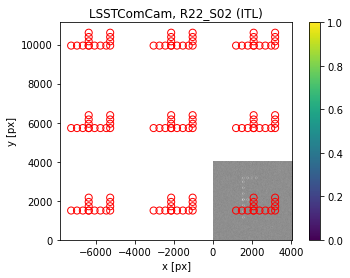

In [10]:
# calculate the position given the x,y 
x,y= wcs.skyToPixelArray(cat_df['ra'], cat_df['dec'],degrees=True)

import lsst.geom
from lsst.afw.geom import makeSkyWcs,  makeCdMatrix
orientation = 0 * lsst.geom.degrees  # 
flipX = True
scale =  0.2 * lsst.geom.arcseconds  # how many arcsec per pixel 
cdMatrix = makeCdMatrix(scale=scale, orientation=orientation, flipX=flipX)

# crval  - `lsst.geom.SpherePoint`  Desired reference sky position.
# crpix = lsst.geom.Point2D(100, 100) - pixel corresponding ot the origin 

crpix = lsst.geom.Point2D(-2188.5, 6225.5)
crval = lsst.geom.SpherePoint(0.0*lsst.geom.degrees, 0.0*lsst.geom.degrees)
newWcs = makeSkyWcs(crpix=crpix, crval=crval, cdMatrix=cdMatrix)

#x,y = newWcs.skyToPixelArray(cat_df['ra'], cat_df['dec'], degrees=True)

# plot the x,y CCD pixel position derived from WCS
# given the input ra,dec catalog... 
plt.imshow(data, origin='lower', vmin=vmin, vmax=vmax,cmap='gray')
plt.scatter(x,y,  facecolors='none', edgecolors='r', marker='o', s=50, )
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')

## Test letter F with 30 deg rotation...

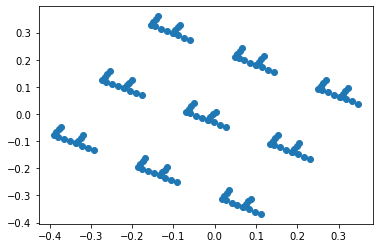

In [8]:
cat = np.genfromtxt('/project/scichris/aos/images/comCam/R22_letterF_30deg_rot.inst',
                        skip_header=16)

cat_df = pd.DataFrame(cat[:, 1:5], columns=['id', 'ra', 'dec', 'g'])


# center around 0 to show the input : 
ra = cat_df['ra']
ra[ra>180] = ra[ra>180]-360
plt.scatter(ra,cat_df['dec'])

Run the comCam, so that I can better test WCS : 


    source "/software/lsstsw/stack/loadLSST.bash"
    setup lsst_distrib
    
    source /project/scichris/aos/setup_aos_current.sh
    
    cd /project/scichris/aos/images/comCam/
    mkdir letter_serial_euler_rot
    mkdir letter_serial_euler_rot/raw/
     
    cd letter_serial_euler_rot
    
    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/comCam/R22_letterF_30deg_rot.inst -i comcam -e 1 -c /project/scichris/aos/images/comCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/comCam/letter_serial_euler_rot/raw/ > starPhoSimLetter.log 2>&1
    
    phosim_repackager.py /project/scichris/aos/images/comCam/letter_serial_euler_rot/raw/ --out_dir /project/scichris/aos/images/comCam/letter_serial_euler_rot/repackaged/ --inst comcam 
    
    
    cp ../letter/runIsr.sh .
    cp ../letter/testPipeline.yaml .
    
    ./runIsr.sh

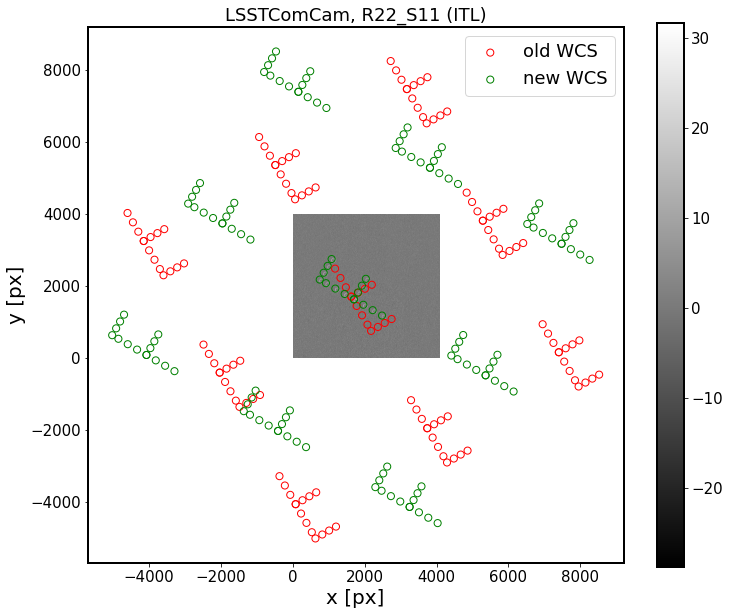

In [98]:
# show the raw image 
from lsst.daf import butler as dafButler
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval

rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18

zscale = ZScaleInterval()

instrument = 'LSSTComCam'
repo_dir = '/project/scichris/aos/images/comCam/letter_serial_euler_rot/DATA/'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded'],
                             )
        
dataId0 = dict(instrument=instrument)
dataset = next(iter(butler.registry.queryDatasets(
                    datasetType='raw',
                    dataId=dataId0  )))

expN = dataset.dataId["exposure"]

exposure = butler.get('postISRCCD', detector='R22_S11', 
                      instrument=instrument,exposure=expN,
          collections=['run1'])
detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})',
         fontsize=18)


# read in the input instance catalog 
cat = np.genfromtxt('/project/scichris/aos/images/comCam/R22_letterF_30deg_rot.inst',
                        skip_header=16)

cat_df = pd.DataFrame(cat[:, 1:5], columns=['id', 'ra', 'dec', 'g'])


# get the wcs 
wcs = exposure.getWcs()

# calculate the position given the x,y 
x,y= wcs.skyToPixelArray(cat_df['ra'], cat_df['dec'],degrees=True)

# plot the original WCS
plt.scatter(x,y,  facecolors='none', edgecolors='r', marker='o', s=50, label='old WCS')


# make new WCS 

import lsst.geom
from lsst.afw.geom import makeSkyWcs,  makeCdMatrix
orientation = 0 * lsst.geom.degrees  # 
flipX = True 
scale =  0.2 * lsst.geom.arcseconds  # how many arcsec per pixel 
cdMatrix = makeCdMatrix(scale=scale, orientation=orientation, flipX=flipX)

# crval  - `lsst.geom.SpherePoint`  Desired reference sky position.
# crpix = lsst.geom.Point2D(100, 100) - pixel corresponding ot the origin 
xPx,yPx = wcs.getPixelOrigin()
crpix = lsst.geom.Point2D(yPx, xPx)
crval = lsst.geom.SpherePoint(0.0*lsst.geom.degrees, 0.0*lsst.geom.degrees)
newWcs = makeSkyWcs(crpix=crpix, crval=crval, cdMatrix=cdMatrix)

# calculate the position  with new WCS given the x,y 
x,y = newWcs.skyToPixelArray(cat_df['ra'], cat_df['dec'],degrees=True)

# plot the new  WCS
plt.scatter(x,y,  facecolors='none', edgecolors='g', marker='o', s=50, label='new WCS')

plt.legend(fontsize=18)


In [87]:
wcs.getCdMatrix()

array([[-3.40179666e-21,  5.55555556e-05],
       [ 5.55555556e-05,  3.40179666e-21]])

Plot the entire focal plane with `cameraGeom`: 

In [70]:
from lsst.daf import butler as dafButler
import lsst.afw.cameraGeom.utils as cameraGeomUtils
import lsst.afw.display as afwDisplay
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval
import os 

afwDisplay.setDefaultBackend("matplotlib")

repo_dir = os.path.join('/project/scichris/aos/images/comCam/letter_serial_euler_rot/DATA/')

# need to specify the calib collections to be able to access the camera 
instrument = 'LSSTComCam'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded']
                         )

dataId0 = dict(instrument=instrument)
dataset = next(iter(
                    butler.registry.queryDatasets(
                        datasetType='postISRCCD', 
                        collections=['run1'],
                        dataId=dataId0  )
                    )
               )

exposure = dataset.dataId["exposure"]

camera  = butler.get("camera", instrument=instrument, exposure=exposure)



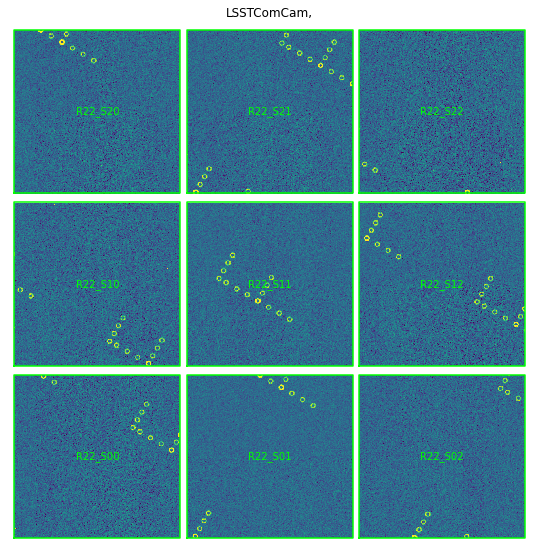

In [72]:
fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0., wspace=0.0, )

ax = fig.add_subplot(1, 1, 1)

disp = afwDisplay.Display(fig)
disp.scale('asinh', 'zscale', Q=2)
#disp.scale('linear', 'minmax')
#disp.scale('asinh', 5, 7000, Q=2)

disp.setImageColormap('viridis' if True else 'gray')
dataType = "postISRCCD"


# use that  to limit what's shown
#detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10']# , 'R34_S20'] 

# set to None to plot everything
detectorNameList = None
mos = cameraGeomUtils.showCamera(camera,
                             cameraGeomUtils.ButlerImage(butler, dataType, 
                                                         instrument=instrument, 
                                                         exposure=exposure,
                                                         verbose=True),
                             binSize=16, 
                             detectorNameList=detectorNameList, 
                             display=disp, overlay=True, title=f'{instrument},' )
                             
disp.show_colorbar(False)
ax.axis("off")

plt.savefig('LsstComCam_letter_serial_euler_rot30.png', bbox_inches='tight')

Swap names of some sensors in focalplanelayout...

 
    cd /project/scichris/aos/images/comCam/
    mkdir letter_serial_euler_rot_swap
    mkdir letter_serial_euler_rot_swap/raw/
     
    cd letter_serial_euler_rot_swap
    
    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/comCam/R22_letterF_30deg_rot.inst -i comcam -e 1 -c /project/scichris/aos/images/comCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/comCam/letter_serial_euler_rot_swap/raw/ > starPhoSimLetter.log 2>&1
    
    phosim_repackager.py /project/scichris/aos/images/comCam/letter_serial_euler_rot_swap/raw/ --out_dir /project/scichris/aos/images/comCam/letter_serial_euler_rot_swap/repackaged/ --inst comcam 
    
    
    cp ../letter/runIsr.sh .
    cp ../letter/testPipeline.yaml .
    
    ./runIsr.sh
    
    

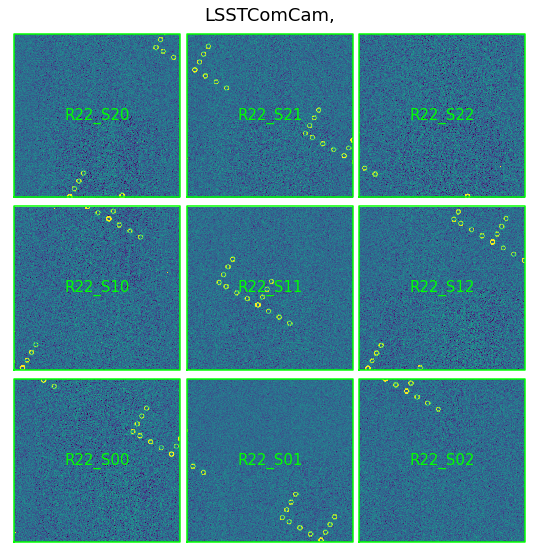

In [105]:
repo_dir = os.path.join('/project/scichris/aos/images/comCam/letter_serial_euler_rot_swap/DATA/')

# need to specify the calib collections to be able to access the camera 
instrument = 'LSSTComCam'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded']
                         )

dataId0 = dict(instrument=instrument)
dataset = next(iter(
                    butler.registry.queryDatasets(
                        datasetType='postISRCCD', 
                        collections=['run1'],
                        dataId=dataId0  )
                    )
               )

exposure = dataset.dataId["exposure"]

camera  = butler.get("camera", instrument=instrument, exposure=exposure)

fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0., wspace=0.0, )

ax = fig.add_subplot(1, 1, 1)

disp = afwDisplay.Display(fig)
disp.scale('asinh', 'zscale', Q=2)
#disp.scale('linear', 'minmax')
#disp.scale('asinh', 5, 7000, Q=2)

disp.setImageColormap('viridis' if True else 'gray')
dataType = "postISRCCD"


# use that  to limit what's shown
#detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10']# , 'R34_S20'] 

# set to None to plot everything
detectorNameList = None
mos = cameraGeomUtils.showCamera(camera,
                             cameraGeomUtils.ButlerImage(butler, dataType, 
                                                         instrument=instrument, 
                                                         exposure=exposure,
                                                         verbose=True),
                             binSize=16, 
                             detectorNameList=detectorNameList, 
                             display=disp, overlay=True, title=f'{instrument},' )
                             
disp.show_colorbar(False)
ax.axis("off")

plt.savefig('LsstComCam_letter_serial_euler_rot30_swap.png', bbox_inches='tight')


In [ ]:
Seems to work! Now test whether the same solution will work for LsstCam:

# LsstCam: original focalplanelayout and segmentation

Make the simulated input catalog x,y positions:

(0.0, 4000.0)

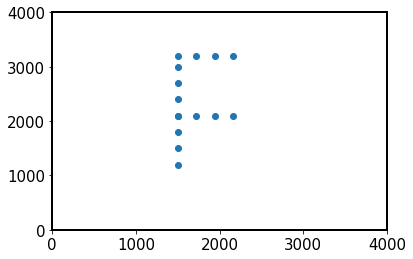

In [2]:
from lsst.ts.phosim.SkySim import SkySim
import numpy as np 
import os
from astropy.table import Table
from astropy.table import  hstack
from astropy.table import  vstack
import matplotlib.pyplot as plt

from matplotlib import rcParams 
rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18

mjd = 57648  # arbitrary observation date 
raInDeg = 0 # telescope pointing in degrees 
declInDeg = 0
rotSkyPos = 30 # rotation angle in degrees 
starMag = 15 # star magnitude 


def pixel_letter_F(xmin=500,ymin=200,width=800,height=1200,xspacing=220,yspacing=200):
    xmax = xmin+width
    ymax = ymin+height
    # initialize array storing coords for all pixels 
    xPx = np.zeros(0)
    yPx = np.zeros(0)

    # middle horizontal line
    x_mid = np.arange(xmin,xmax,xspacing)
    y_mid = np.ones_like(x_mid) * ((ymin+ymax)/2.)
    xPx = np.append(xPx, x_mid)
    yPx = np.append(yPx, y_mid)
    
    # top horizontal line
    x_top = x_mid.copy()
    y_top = np.ones_like(x_top)*ymax
    xPx = np.append(xPx, x_top)
    yPx = np.append(yPx, y_top)

    # vertical line
    y_vert = np.arange(ymin+200,ymax-100,yspacing)
    x_vert = np.ones_like(y_vert)*xmin
    xPx = np.append(xPx, x_vert)
    yPx = np.append(yPx, y_vert)

    return xPx, yPx

%matplotlib inline
x,y  = pixel_letter_F(xmin=1500,ymin=1000,yspacing=300, height=2200 )
plt.scatter(x,y)
plt.xlim(0,4000)
plt.ylim(0,4000)





Transform these into ra,dec with `SkySim`: 

<ipython-input-20-3c93210ab971>:7: DeprecationWarning: The argument of mjd is deprecated.
  skySim.setObservationMetaData(raInDeg, declInDeg, rotSkyPos, mjd)


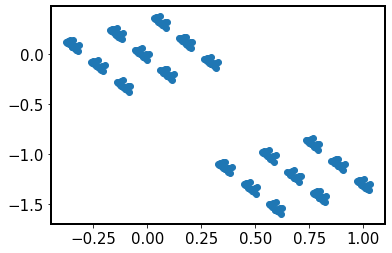

In [20]:
# Declare the SkySim()
skySim = SkySim()

# rotSkyPos = 30  - to rotate by 30 degrees 
rotSkyPos = 60 
# Set the observation information
skySim.setObservationMetaData(raInDeg, declInDeg, rotSkyPos, mjd)

# R22 only ... 

# sensorName = ["R22_S00", "R22_S01","R22_S02",
#               "R22_S10", "R22_S11","R22_S12",
#               "R22_S20", "R22_S21","R22_S22"
#              ] 



# R22 (E2V for LsstCam) and R20 (ITL for LsstCam)
sensorName = ["R22_S00", "R22_S01","R22_S02",
              "R22_S10", "R22_S11","R22_S12",
              "R22_S20", "R22_S21","R22_S22",
              
              "R20_S00", "R20_S01", "R20_S02",
              "R20_S10", "R20_S11", "R20_S12",
              "R20_S20", "R20_S21", "R20_S22"
             ] 

# add arrow per ComCam sensor (CCD)
xPx, yPx  = pixel_letter_F(xmin=1500,ymin=1000,yspacing=300, height=2200 )

store_x = []
store_y = []
starId = 0 
for sensor in sensorName:
    for i in range(len(xPx)):
        skySim.addStarByChipPos(sensor, starId, xPx[i],
                                yPx[i], starMag)
        store_x.append(xPx[i])
        store_y.append(yPx[i])
        starId += 1 
        
ra,dec = skySim.getRaDecInDeg()
mags = skySim.getStarMag()
coords_com = Table(data=[ra,dec, store_x,store_y,mags], 
             names=['ra','dec', 'xPx', 'yPx','g' ]  )

# add a column with object id 
coords_com['objid'] = np.arange(len(coords_com))

# center around 0 to show the input : 
ra = coords_com['ra']
ra[ra>180] = ra[ra>180]-360
plt.scatter(ra,coords_com['dec'])


In [10]:

# NB:  here we only do 0.25 sec exposure to quickly test if the image is properly made 
# in generating large catalogs, change to 15 sec. 
def writePhosimHeader(output, ra, dec, rotskypos=0, rottelpos=0, 
                      camconfig=3, Opsim_filter=3, mjd=59580., exposure=0.25,
                     obsid=9006002, defocal=False,
                     opsim_rawseeing=0.69):
    '''Write to file handle the phosim header'''
    output.write("Opsim_obshistid {}\n".format(obsid))
    output.write("Opsim_filter {}\n".format(Opsim_filter))
    output.write("mjd {}\n".format(mjd))
    output.write("SIM_SEED {}\n".format(1000))
    output.write("rightascension {}\n".format(ra))
    output.write("declination {}\n".format(dec))
    output.write("rotskypos {}\n".format(rotskypos))
    output.write("rottelpos {}\n".format(rottelpos))
    output.write("SIM_VISTIME {}\n".format(exposure))
    output.write("SIM_NSNAP {}\n".format(1))
    output.write("moonphase {}\n".format(0.0))
    output.write("moonalt {}\n".format(-90))
    output.write("sunalt {}\n".format(-90))
    output.write("Opsim_rawseeing {}\n".format(opsim_rawseeing))
    if defocal:
        output.write("move 10 -1500.0000\n") # write the defocal movement 
    output.write("camconfig {}\n".format(camconfig))

def writePhosimInstFile(catalog, ra, dec, rotskypos=0,  phosimFile="stars.inst", 
                        passband='r', outDir="./", camconfig=3, opd=False,
                        mjd=59580,exposure=.25, obsid=9006002, defocal=False,
                        constMag=15. ):
    '''Generate a phosim instance catalog from a Pandas dataframe or Astropy Table '''
    
    passbands = {"u":"umeanpsfmag", 
                 "g":"gmeanpsfmag", 
                 "r":"rmeanpsfmag", 
                 "i":"imeanpsfmag", 
                 "z":"zmeanpsfmag", 
                 "y":"ymeanpsfmag", 
                }
    
    outFile = os.path.join(outDir, phosimFile)
    
    filterID = list(passbands.keys()).index(passband)
    with open(outFile,'w') as output:
        writePhosimHeader(output, ra, dec, rotskypos=rotskypos, camconfig=camconfig, 
                          Opsim_filter=filterID, mjd=mjd,
                         exposure=exposure, obsid=obsid, defocal=defocal)
        if (opd==True):
            output.write("opd 0 {} {} 500".format(ra,dec))
        else:
            for idx in range(len(catalog)):
                row = catalog[idx]
                output.write("object {} {} {} {} ../sky/sed_flat.txt 0.0 0.0 0.0 0.0 0.0 0.0 star 12.0 none none\n".format(
                    int(row["objid"]),row["ra"],row["dec"], constMag))
    print('Saved as ', outFile)
    return outFile
 
    


NB: if the letters are rotated, need to set rotskypos to 0, otherwise it will correct for that rotation and the result will be nil (i.e. rotation has been counteracted) 

In [15]:
writePhosimInstFile(coords_com, ra=raInDeg, dec=declInDeg, rotskypos=0 , phosimFile='R22_R20_letterF_rot_30_N.inst', 
                    outDir='/project/scichris/aos/images/lsstCam/',
                    passband='g', mjd=mjd, exposure=0.25, obsid=9006002, 
                    defocal=True,constMag=starMag )

Saved as  /project/scichris/aos/images/lsstCam/R22_R20_letterF_rot_30_N.inst


'/project/scichris/aos/images/lsstCam/R22_R20_letterF_rot_30_N.inst'

Run quick simulation for lsstCam R22 only - confirm that it is basically transposed, just like for comCam 


    cd /project/scichris/aos/images/lsstCam/
    mkdir letter_a_original_rot
    mkdir letter_a_original_rot/raw/
     
    cd letter_a_original_rot
    
    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/R22_letterF_30deg_rot.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/lsstCam/letter_a_original_rot/raw/ > starPhoSimLetter.log 2>&1
    
    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_a_original_rot/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_a_original_rot/repackaged/ --inst lsst 
    
    
    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .
    
    ./runIsr.sh
    
    


    
   

Text(0.5, 1.0, 'LSSTCam, R22_S02 (E2V)')

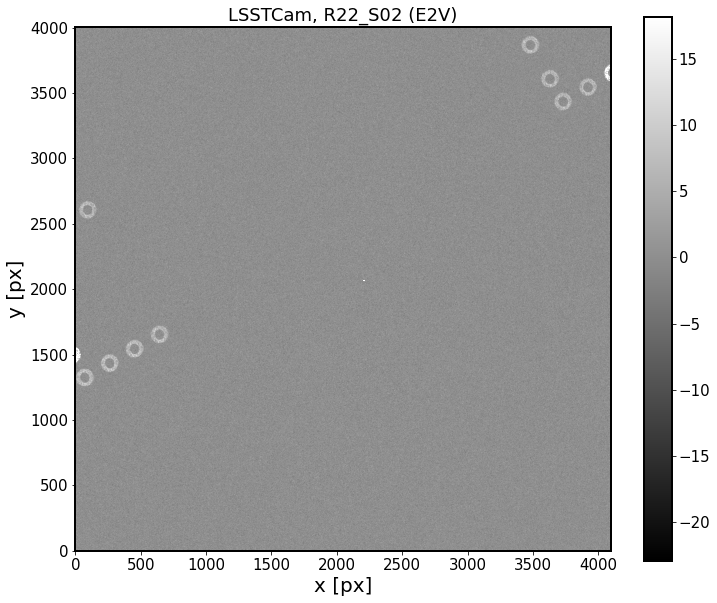

In [110]:
# show the raw image 
from lsst.daf import butler as dafButler
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval
zscale = ZScaleInterval()

instrument = 'LSSTCam'
repo_dir = '/project/scichris/aos/images/lsstCam/letter_a_original_rot/DATA/'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded'],
                             )
        
dataId0 = dict(instrument=instrument)
dataset = next(iter(butler.registry.queryDatasets(
                    datasetType='raw',
                    dataId=dataId0  )))

expN = dataset.dataId["exposure"]

exposure = butler.get('postISRCCD', detector='R22_S02', 
                      instrument=instrument,exposure=expN,
          collections=['run1'])
detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')

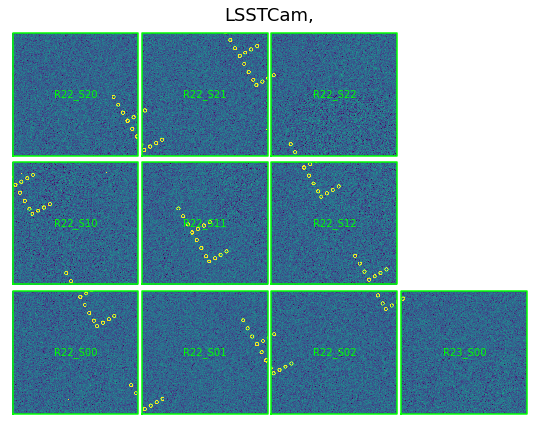

In [114]:
repo_dir = os.path.join('/project/scichris/aos/images/lsstCam/letter_a_original_rot/DATA/')

# need to specify the calib collections to be able to access the camera 
instrument = 'LSSTCam'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded']
                         )

dataId0 = dict(instrument=instrument)
dataset = next(iter(
                    butler.registry.queryDatasets(
                        datasetType='postISRCCD', 
                        collections=['run1'],
                        dataId=dataId0  )
                    )
               )

exposure = dataset.dataId["exposure"]

camera  = butler.get("camera", instrument=instrument, exposure=exposure)

fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0., wspace=0.0, )

ax = fig.add_subplot(1, 1, 1)

disp = afwDisplay.Display(fig)
disp.scale('asinh', 'zscale', Q=2)
#disp.scale('linear', 'minmax')
#disp.scale('asinh', 5, 7000, Q=2)

disp.setImageColormap('viridis' if True else 'gray')
dataType = "postISRCCD"


# use that  to limit what's shown
#detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10']# , 'R34_S20'] 

# set to None to plot everything
#detectorNameList = None
detectorNameList = ['R22_S20', 'R22_S21', 'R22_S22',
                    'R22_S10', 'R22_S11', 'R22_S12',
                    'R22_S00', 'R22_S01', 'R22_S02',
                    'R23_S00'
                   ]

mos = cameraGeomUtils.showCamera(camera,
                             cameraGeomUtils.ButlerImage(butler, dataType, 
                                                         instrument=instrument, 
                                                         exposure=exposure,
                                                         verbose=True),
                             binSize=16, 
                             detectorNameList=detectorNameList, 
                             display=disp, overlay=True, title=f'{instrument}, original' )
                             
disp.show_colorbar(False)
ax.axis("off")

plt.savefig('LsstCam_letter_a_orig_rot30.png', bbox_inches='tight')


b) Try changing the Euler angle in focalplanelayout:

     python /home/scichris/notebooks/update_focalplanelayout_lsst.py  with update_euler = True 
     
     cd /project/scichris/aos/phosim_syseng4/data/lsst
     cp focalplanelayout_DM-30367.txt focalplanelayout.txt 
     
     cd /project/scichris/aos/images/lsstCam/
    mkdir letter_b_euler_rot
    mkdir letter_b_euler_rot/raw/
     
    cd letter_b_euler_rot
    
    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/R22_letterF_30deg_rot.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/lsstCam/letter_b_euler_rot/raw/ > starPhoSimLetter.log 2>&1
    
    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_b_euler_rot/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_b_euler_rot/repackaged/ --inst lsst 
    
    
    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .
    
    ./runIsr.sh

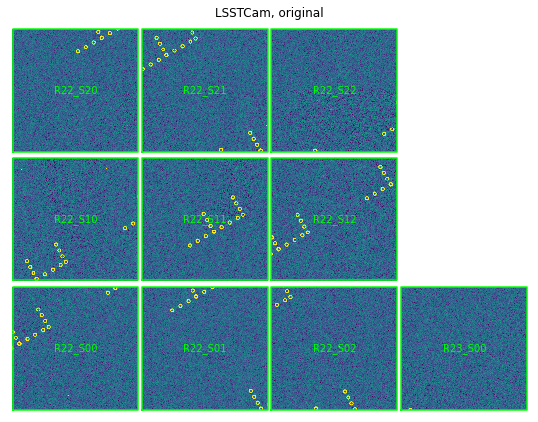

In [4]:
import os
# show the raw image 
from lsst.daf import butler as dafButler
import lsst.afw.cameraGeom.utils as cameraGeomUtils
import lsst.afw.display as afwDisplay

import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval

afwDisplay.setDefaultBackend("matplotlib")
zscale = ZScaleInterval()
repo_dir = os.path.join('/project/scichris/aos/images/lsstCam/letter_b_euler_rot/DATA/')

# need to specify the calib collections to be able to access the camera 
instrument = 'LSSTCam'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded']
                         )

dataId0 = dict(instrument=instrument)
dataset = next(iter(
                    butler.registry.queryDatasets(
                        datasetType='postISRCCD', 
                        collections=['run1'],
                        dataId=dataId0  )
                    )
               )

exposure = dataset.dataId["exposure"]

camera  = butler.get("camera", instrument=instrument, exposure=exposure)

fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0., wspace=0.0, )

ax = fig.add_subplot(1, 1, 1)

disp = afwDisplay.Display(fig)
disp.scale('asinh', 'zscale', Q=2)
#disp.scale('linear', 'minmax')
#disp.scale('asinh', 5, 7000, Q=2)

disp.setImageColormap('viridis' if True else 'gray')
dataType = "postISRCCD"


# use that  to limit what's shown
#detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10']# , 'R34_S20'] 

# set to None to plot everything
#detectorNameList = None
detectorNameList = ['R22_S20', 'R22_S21', 'R22_S22',
                    'R22_S10', 'R22_S11', 'R22_S12',
                    'R22_S00', 'R22_S01', 'R22_S02',
                    'R23_S00'
                   ]

mos = cameraGeomUtils.showCamera(camera,
                             cameraGeomUtils.ButlerImage(butler, dataType, 
                                                         instrument=instrument, 
                                                         exposure=exposure,
                                                         verbose=True),
                             binSize=16, 
                             detectorNameList=detectorNameList, 
                             display=disp, overlay=True, title=f'{instrument}, original' )
                             
disp.show_colorbar(False)
ax.axis("off")

plt.savefig('LsstCam_letter_b_euler_rot30.png', bbox_inches='tight')


b) Try changing the Euler angle in focalplanelayout as -90 (the other direction...)

    python /home/scichris/notebooks/update_focalplanelayout_lsst.py  with update_euler = True  as -90 

    cd /project/scichris/aos/phosim_syseng4/data/lsst
    cp focalplanelayout_DM-30367.txt focalplanelayout.txt 

    cd /project/scichris/aos/images/lsstCam/
    mkdir letter_b_euler_rot1
    mkdir letter_b_euler_rot1/raw/

    cd letter_b_euler_rot1

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/R22_letterF_30deg_rot.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/lsstCam/letter_b_euler_rot1/raw/ > starPhoSimLetter.log 2>&1

    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_b_euler_rot1/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_b_euler_rot1/repackaged/ --inst lsst 


    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .

    ./runIsr.sh

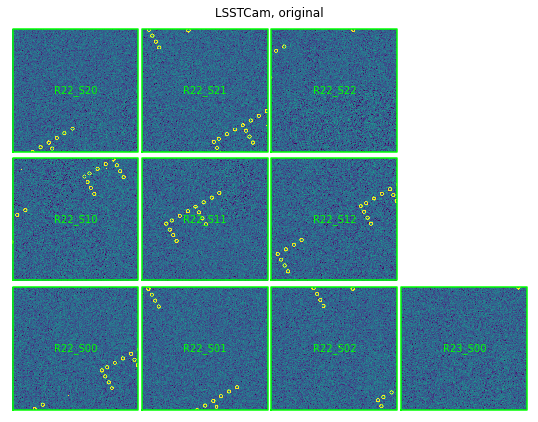

In [5]:
import os
# show the raw image 
from lsst.daf import butler as dafButler
import lsst.afw.cameraGeom.utils as cameraGeomUtils
import lsst.afw.display as afwDisplay

import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval

afwDisplay.setDefaultBackend("matplotlib")
zscale = ZScaleInterval()
repo_dir = os.path.join('/project/scichris/aos/images/lsstCam/letter_b_euler_rot1/DATA/')

# need to specify the calib collections to be able to access the camera 
instrument = 'LSSTCam'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded']
                         )

dataId0 = dict(instrument=instrument)
dataset = next(iter(
                    butler.registry.queryDatasets(
                        datasetType='postISRCCD', 
                        collections=['run1'],
                        dataId=dataId0  )
                    )
               )

exposure = dataset.dataId["exposure"]

camera  = butler.get("camera", instrument=instrument, exposure=exposure)

fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0., wspace=0.0, )

ax = fig.add_subplot(1, 1, 1)

disp = afwDisplay.Display(fig)
disp.scale('asinh', 'zscale', Q=2)
#disp.scale('linear', 'minmax')
#disp.scale('asinh', 5, 7000, Q=2)

disp.setImageColormap('viridis' if True else 'gray')
dataType = "postISRCCD"


# use that  to limit what's shown
#detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10']# , 'R34_S20'] 

# set to None to plot everything
#detectorNameList = None
detectorNameList = ['R22_S20', 'R22_S21', 'R22_S22',
                    'R22_S10', 'R22_S11', 'R22_S12',
                    'R22_S00', 'R22_S01', 'R22_S02',
                    'R23_S00'
                   ]

mos = cameraGeomUtils.showCamera(camera,
                             cameraGeomUtils.ButlerImage(butler, dataType, 
                                                         instrument=instrument, 
                                                         exposure=exposure,
                                                         verbose=True),
                             binSize=16, 
                             detectorNameList=detectorNameList, 
                             display=disp, overlay=True, title=f'{instrument}, original' )
                             
disp.show_colorbar(False)
ax.axis("off")

plt.savefig('LsstCam_letter_b_euler_rot30_1.png', bbox_inches='tight')


c) Try changing the Euler angle as +90 (same as for ComCam) in focalplanelayout, serial direction in segmentation. Since LsstCam is a mixture of E2V and ITL,  try changing the direction 

Need to test R20 which is ITL, and R22 which is E2V 



But first, make an un-rotated letter for R20 and R22 :

    python /home/scichris/notebooks/update_focalplanelayout_lsst.py   wupdate_euler = False
    cd /project/scichris/aos/phosim_syseng4/data/lsst
    cp focalplanelayout_DM-28557.txt focalplanelayout.txt 

    cd /project/scichris/aos/images/lsstCam/
    mkdir letter_R22_R20_orig
    mkdir letter_R22_R20_orig/raw/

    cd letter_R22_R20_orig

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/R22_R20_letterF.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25 -s "R22_S20|R20_S20" -o /project/scichris/aos/images/lsstCam/letter_R22_R20_orig/raw/ > starPhoSimLetter.log 2>&1

    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_R22_R20_orig/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_R22_R20_orig/repackaged/ --inst lsst 


    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .

    ./runIsr.sh




Text(0.5, 1.0, 'LSSTCam, R20_S20 (ITL)')

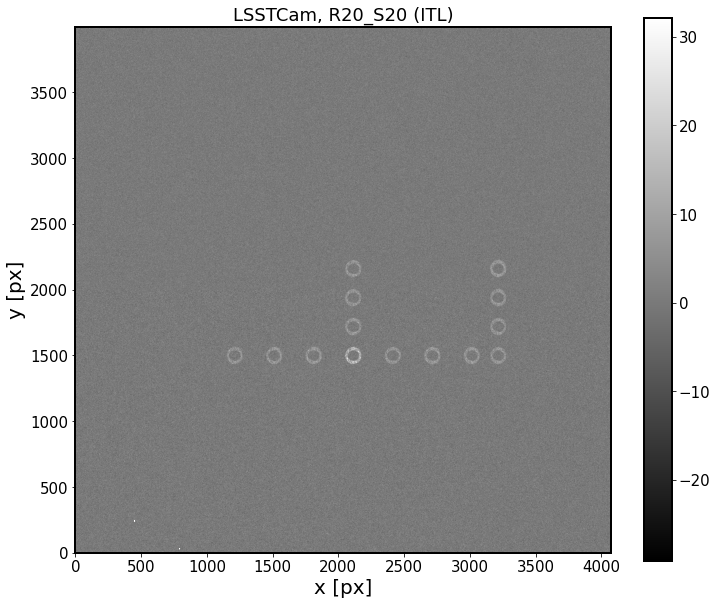

In [23]:
# show the raw image 
from lsst.daf import butler as dafButler
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval
zscale = ZScaleInterval()

instrument = 'LSSTCam'
repo_dir = '/project/scichris/aos/images/lsstCam/letter_R22_R20_orig/DATA/'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded'],
                             )
        
dataId0 = dict(instrument=instrument)
dataset = next(iter(butler.registry.queryDatasets(
                    datasetType='raw',
                    dataId=dataId0  )))

expN = dataset.dataId["exposure"]

exposure = butler.get('postISRCCD', detector='R20_S20', 
                      instrument=instrument,exposure=expN,
          collections=['run1'])
detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')

plt.title(f'{instrument}, {detector.getName()} ({detector.getSerial()[:3]})')

Now update the Euler angle and test how it affects these two:


    python /home/scichris/notebooks/update_focalplanelayout_lsst.py   update_euler = True as +90
    cd /project/scichris/aos/phosim_syseng4/data/lsst
    cp focalplanelayout_DM-30367.txt focalplanelayout.txt 

    cd /project/scichris/aos/images/lsstCam/
    mkdir letter_R22_R20_euler
    mkdir letter_R22_R20_euler/raw/

    cd letter_R22_R20_euler

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/R22_R20_letterF.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25 -s "R22_S20|R20_S20" -o /project/scichris/aos/images/lsstCam/letter_R22_R20_euler/raw/ > starPhoSimLetter.log 2>&1

    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_R22_R20_euler/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_R22_R20_euler/repackaged/ --inst lsst 


    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .

    ./runIsr.sh




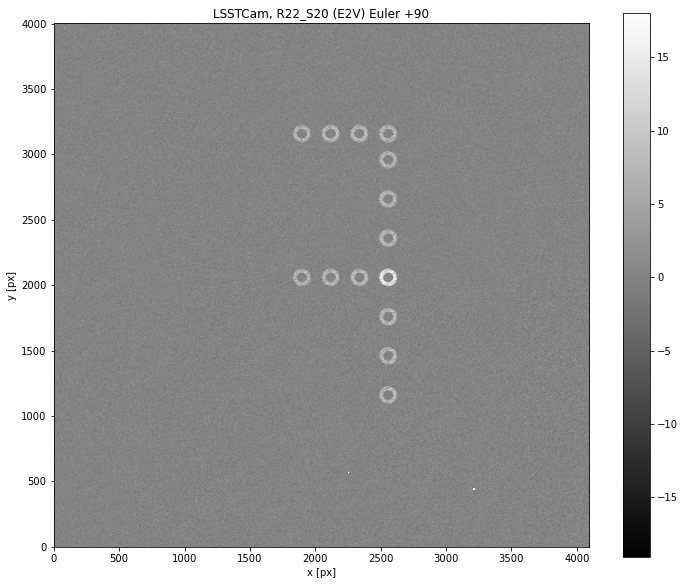

In [9]:
# show the raw image 
from lsst.daf import butler as dafButler
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval
zscale = ZScaleInterval()

instrument = 'LSSTCam'
repo_dir = '/project/scichris/aos/images/lsstCam/letter_R22_R20_euler/DATA/'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded'],
                             )
        
dataId0 = dict(instrument=instrument)
dataset = next(iter(butler.registry.queryDatasets(
                    datasetType='raw',
                    dataId=dataId0  )))

expN = dataset.dataId["exposure"]

exposure = butler.get('postISRCCD', detector='R22_S20', 
                      instrument=instrument,exposure=expN,
          collections=['run1'])
detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')
detectorName, detectorType = detector.getName(), detector.getSerial()[:3] 
plt.title(f'{instrument}, {detectorName} ({detectorType}) Euler +90')
plt.savefig(f'{instrument}_letter_{detectorName}_euler_{detectorType}.png', bbox_inches='tight')

ok, so both R20 (ITL) and R22 (E2V) reacted the same way. Now try changing the serial direction...


Ok,  ITL has serial always -1, so flipping it is setting it to +1 , that's why it worked for LsstCam 

But for E2V, serial is -1 for C00...C07  and 1 for C10...C17,  so switching it to opposite would be 
+1 for C00...C07 and  -1 for C10...17 

So best to multiply by "-1" the content of serial 


    

Test how that would work : 

In [5]:
serialread = '1'
str(int(serialread) * -1)

'-1'

    # on LSP
    python /home/scichris/notebooks/update_focalplanelayout_lsst.py   update_euler = True as +90
    cd /project/scichris/aos/phosim_syseng4/data/lsst
    cp focalplanelayout_DM-30367.txt focalplanelayout.txt 

    python /home/scichris/notebooks/update_segmentation_lsst.py   change_serial = True  (using -1 multiplication)
    cd /project/scichris/aos/phosim_syseng4/data/lsst
    cp segmentation_DM-30367.txt segmentation.txt 
    
    # on NCSA terminal
    cd /project/scichris/aos/images/lsstCam/
    mkdir letter_R22_R20_euler_serial
    mkdir letter_R22_R20_euler_serial/raw/

    cd letter_R22_R20_euler_serial

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/R22_R20_letterF.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25 -s "R22_S20|R20_S20" -o /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial/raw/ > starPhoSimLetter.log 2>&1

    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial/repackaged/ --inst lsst 


    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .

    ./runIsr.sh
    

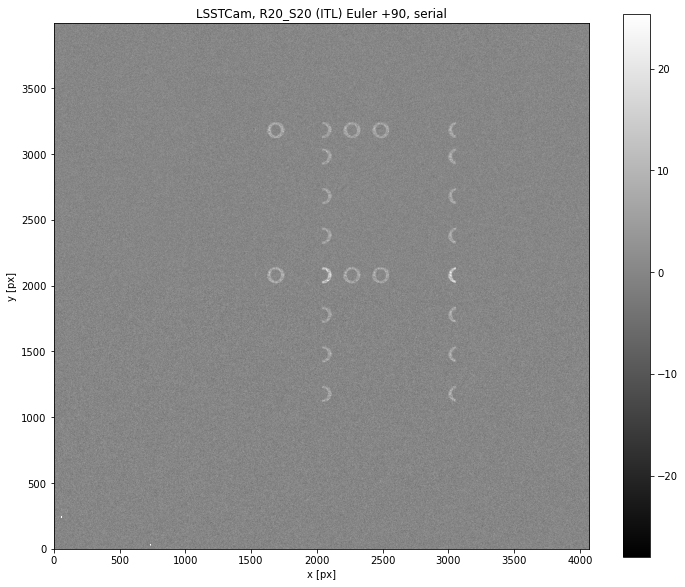

In [13]:
# show the raw image 
from lsst.daf import butler as dafButler
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval
zscale = ZScaleInterval()

instrument = 'LSSTCam'
repo_dir = '/project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial/DATA/'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded'],
                             )
        
dataId0 = dict(instrument=instrument)
dataset = next(iter(butler.registry.queryDatasets(
                    datasetType='raw',
                    dataId=dataId0  )))

expN = dataset.dataId["exposure"]

exposure = butler.get('postISRCCD', detector='R20_S20', 
                      instrument=instrument,exposure=expN,
          collections=['run1'])
detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')
detectorName, detectorType = detector.getName(), detector.getSerial()[:3] 
plt.title(f'{instrument}, {detectorName} ({detectorType}) Euler +90, serial')
plt.savefig(f'{instrument}_letter_{detectorName}_euler_serial_{detectorType}.png', bbox_inches='tight')

ok, looks fine, i.e. just switching serial to the opposite one worked fine for both E2V and ITL. Add remapping channels in segmentation.txt: 


    python /home/scichris/notebooks/update_focalplanelayout_lsst.py   update_euler = True as +90
    cd /project/scichris/aos/phosim_syseng4/data/lsst
    cp focalplanelayout_DM-30367.txt focalplanelayout.txt 

    python /home/scichris/notebooks/update_segmentation_lsst.py   change_serial = True  (using -1 multiplication)
                                                                  remap_channels = True 
    cd /project/scichris/aos/phosim_syseng4/data/lsst
    cp segmentation_DM-30367.txt segmentation.txt 
    
    # on NCSA terminal
    cd /project/scichris/aos/images/lsstCam/
    mkdir letter_R22_R20_euler_serial_remap
    mkdir letter_R22_R20_euler_serial_remap/raw/

    cd letter_R22_R20_euler_serial_remap

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/R22_R20_letterF.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25 -s "R22_S20|R20_S20" -o /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap/raw/ > starPhoSimLetter.log 2>&1

    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap/repackaged/ --inst lsst 


    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .

    ./runIsr.sh

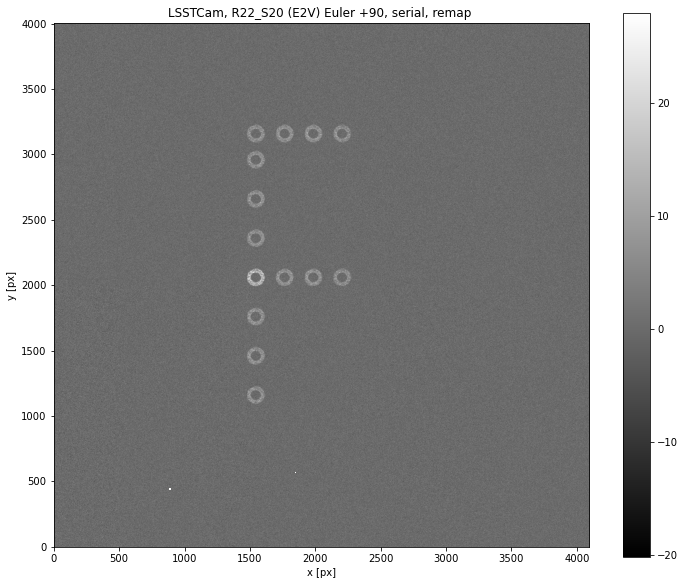

In [15]:
# show the raw image 
from lsst.daf import butler as dafButler
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval
zscale = ZScaleInterval()

instrument = 'LSSTCam'
repo_dir = '/project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap/DATA/'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded'],
                             )
        
dataId0 = dict(instrument=instrument)
dataset = next(iter(butler.registry.queryDatasets(
                    datasetType='raw',
                    dataId=dataId0  )))

expN = dataset.dataId["exposure"]

exposure = butler.get('postISRCCD', detector='R22_S20', 
                      instrument=instrument,exposure=expN,
          collections=['run1'])
detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data, origin='lower', vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')
detectorName, detectorType = detector.getName(), detector.getSerial()[:3] 
plt.title(f'{instrument}, {detectorName} ({detectorType}) Euler +90, serial, remap ')
plt.savefig(f'{instrument}_letter_{detectorName}_euler_serial_remap_{detectorType}.png', bbox_inches='tight')

ok, seems to work great for both ITL and E2V types (!).

The last thing is to test the orientation of detectors within a raft. Use the rotated letter,  simulate entire R22 raft (to test the center), and  then R20 raft (off-center)



First, rotated letter F within R22: 

    python /home/scichris/notebooks/update_focalplanelayout_lsst.py   update_euler = True as +90
    cd /project/scichris/aos/phosim_syseng4/data/lsst
    cp focalplanelayout_DM-30367.txt focalplanelayout.txt 

    python /home/scichris/notebooks/update_segmentation_lsst.py   change_serial = True  (using -1 multiplication)
                                                                  remap_channels = True 
    cd /project/scichris/aos/phosim_syseng4/data/lsst
    cp segmentation_DM-30367.txt segmentation.txt 
    
    
    cd /project/scichris/aos/images/lsstCam/
    mkdir letter_R22_euler_serial_remap_rot
    mkdir letter_R22_euler_serial_remap_rot/raw/

    cd letter_R22_euler_serial_remap_rot

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/R22_letterF_30deg_rot.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/lsstCam/letter_R22_euler_serial_remap_rot/raw/ > starPhoSimLetter.log 2>&1



    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_R22_euler_serial_remap_rot/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_R22_euler_serial_remap_rot/repackaged/ --inst lsst 


    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .

    ./runIsr.sh

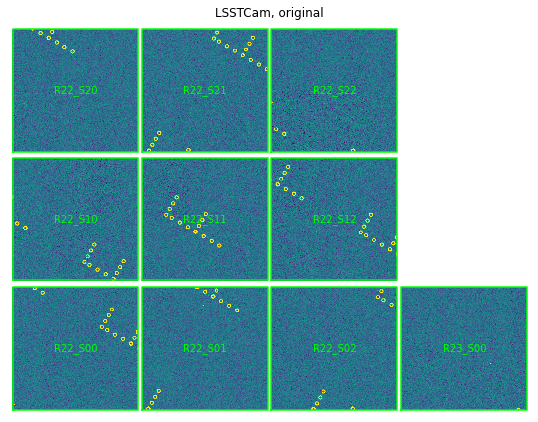

In [16]:
import os
# show the raw image 
from lsst.daf import butler as dafButler
import lsst.afw.cameraGeom.utils as cameraGeomUtils
import lsst.afw.display as afwDisplay

import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval

afwDisplay.setDefaultBackend("matplotlib")
zscale = ZScaleInterval()
repo_dir = os.path.join('/project/scichris/aos/images/lsstCam/letter_R22_euler_serial_remap_rot/DATA/')

# need to specify the calib collections to be able to access the camera 
instrument = 'LSSTCam'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded']
                         )

dataId0 = dict(instrument=instrument)
dataset = next(iter(
                    butler.registry.queryDatasets(
                        datasetType='postISRCCD', 
                        collections=['run1'],
                        dataId=dataId0  )
                    )
               )

exposure = dataset.dataId["exposure"]

camera  = butler.get("camera", instrument=instrument, exposure=exposure)

fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0., wspace=0.0, )

ax = fig.add_subplot(1, 1, 1)

disp = afwDisplay.Display(fig)
disp.scale('asinh', 'zscale', Q=2)
#disp.scale('linear', 'minmax')
#disp.scale('asinh', 5, 7000, Q=2)

disp.setImageColormap('viridis' if True else 'gray')
dataType = "postISRCCD"


# use that  to limit what's shown
#detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10']# , 'R34_S20'] 

# set to None to plot everything
#detectorNameList = None
detectorNameList = ['R22_S20', 'R22_S21', 'R22_S22',
                    'R22_S10', 'R22_S11', 'R22_S12',
                    'R22_S00', 'R22_S01', 'R22_S02',
                    'R23_S00'
                   ]

mos = cameraGeomUtils.showCamera(camera,
                             cameraGeomUtils.ButlerImage(butler, dataType, 
                                                         instrument=instrument, 
                                                         exposure=exposure,
                                                         verbose=True),
                             binSize=16, 
                             detectorNameList=detectorNameList, 
                             display=disp, overlay=True, title=f'{instrument}, original' )
                             
disp.show_colorbar(False)
ax.axis("off")

plt.savefig('LsstCam_letter_R22_euler_serial_remap_rot30.png', bbox_inches='tight')


Check if the same is happening with R20  - simulate letters that should be centered on R22 and R20 


  #### these steps were already done for the image above with rotated R22 F letter
    python /home/scichris/notebooks/update_focalplanelayout_lsst.py   update_euler = True as +90
    cd /project/scichris/aos/phosim_syseng4/data/lsst
    cp focalplanelayout_DM-30367.txt focalplanelayout.txt 

    python /home/scichris/notebooks/update_segmentation_lsst.py   change_serial = True  (using -1 multiplication)
                                                                  remap_channels = True 
    cd /project/scichris/aos/phosim_syseng4/data/lsst
    cp segmentation_DM-30367.txt segmentation.txt 
    
  #### these steps are new
    cd /project/scichris/aos/images/lsstCam/
    mkdir letter_R22_R20_euler_serial_remap_rot
    mkdir letter_R22_R20_euler_serial_remap_rot/raw/

    cd letter_R22_R20_euler_serial_remap_rot

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/R22_R20_letterF_rot_30.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot/raw/ > starPhoSimLetter.log 2>&1



    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot/repackaged/ --inst lsst 


    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .

    ./runIsr.sh
    


So it says rotSkyPos = 30 .... Repackaged with derotate, it should change that to 120 .. 

Why cameraGeom plots it as correctly rotated? Show the input catalog:

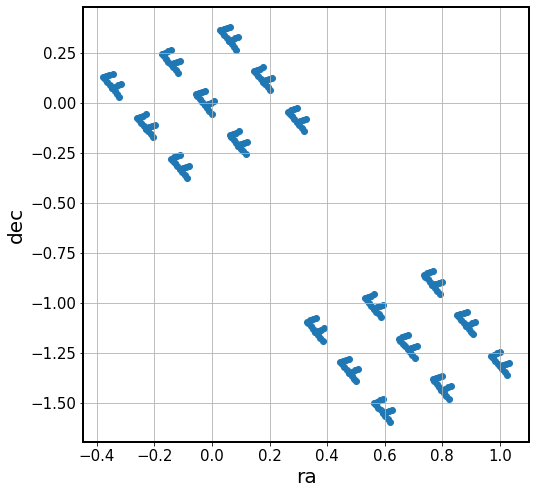

In [32]:
import numpy as np
import pandas as pd 
# show the input instance catalog made with sky sim 

# read in the input instance catalog 
cat = np.genfromtxt('/project/scichris/aos/images/lsstCam/R22_R20_letterF_rot_30.inst',
                        skip_header=16)

cat_df = pd.DataFrame(cat[:, 1:5], columns=['id', 'ra', 'dec', 'g'])

import matplotlib.pyplot as plt

from matplotlib import rcParams 
rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18


# center around 0 to show the input : 
ra = cat_df['ra']
ra[ra>180] = ra[ra>180]-360
fig,ax = plt.subplots(1,1,figsize=(8,8))
ax.scatter(ra,cat_df['dec'])
ax.set_xlabel('ra')
ax.set_ylabel('dec')
ax.grid()

Reading 99: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 99, exposure: 4016091606002} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].


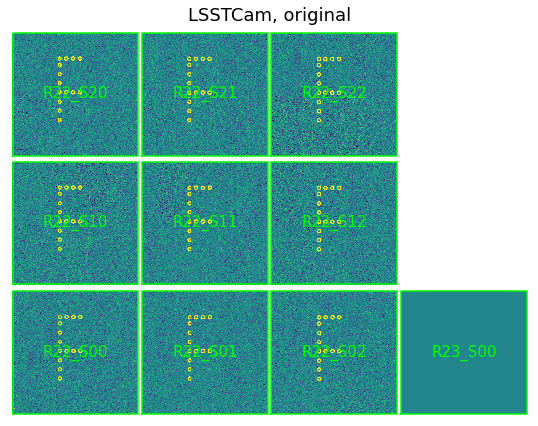

In [14]:
import os
# show the raw image 
from lsst.daf import butler as dafButler
import lsst.afw.cameraGeom.utils as cameraGeomUtils
import lsst.afw.display as afwDisplay

import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval

afwDisplay.setDefaultBackend("matplotlib")
zscale = ZScaleInterval()
repo_dir = os.path.join('/project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot/DATA/')

# need to specify the calib collections to be able to access the camera 
instrument = 'LSSTCam'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded']
                         )

dataId0 = dict(instrument=instrument)
dataset = next(iter(
                    butler.registry.queryDatasets(
                        datasetType='postISRCCD', 
                        collections=['run1'],
                        dataId=dataId0  )
                    )
               )

exposure = dataset.dataId["exposure"]

camera  = butler.get("camera", instrument=instrument, exposure=exposure)

fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0., wspace=0.0, )

ax = fig.add_subplot(1, 1, 1)

disp = afwDisplay.Display(fig)
disp.scale('asinh', 'zscale', Q=2)
#disp.scale('linear', 'minmax')
#disp.scale('asinh', 5, 7000, Q=2)

disp.setImageColormap('viridis' if True else 'gray')
dataType = "postISRCCD"


# use that  to limit what's shown
#detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10']# , 'R34_S20'] 

# set to None to plot everything
#detectorNameList = None
detectorNameList = ['R22_S20', 'R22_S21', 'R22_S22',
                    'R22_S10', 'R22_S11', 'R22_S12',
                    'R22_S00', 'R22_S01', 'R22_S02',
                    'R23_S00'
                   ]

mos = cameraGeomUtils.showCamera(camera,
                             cameraGeomUtils.ButlerImage(butler, dataType, 
                                                         instrument=instrument, 
                                                         exposure=exposure,
                                                         verbose=True),
                             binSize=16, 
                             detectorNameList=detectorNameList, 
                             display=disp, overlay=True, title=f'{instrument}, original' )
                             
disp.show_colorbar(False)
ax.axis("off")

plt.savefig('LsstCam_letter_R22_R20_euler_serial_remap_rot30.png', bbox_inches='tight')


haha, so this is because the sky catalog has rotated the letters, but the rotSkyPos has un-rotated them by telling that we need to rotate the telescope... The result is that the 30 degree rotation got offset by a 30 degree telescope rotation. 

So feed rotated letters with 'rotSkyPos = 0` in the inst file : 


 #### these steps are new
    cd /project/scichris/aos/images/lsstCam/
    mkdir letter_R22_R20_euler_serial_remap_rot_N
    mkdir letter_R22_R20_euler_serial_remap_rot_N/raw/

    cd letter_R22_R20_euler_serial_remap_rot_N

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/R22_R20_letterF_rot_30_N.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot_N/raw/ > starPhoSimLetter.log 2>&1



    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot_N/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot_N/repackaged/ --inst lsst 


    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .

    ./runIsr.sh
    

Reading 123: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 123, exposure: 4016091606002} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].
Reading 99: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 99, exposure: 4016091606002} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].


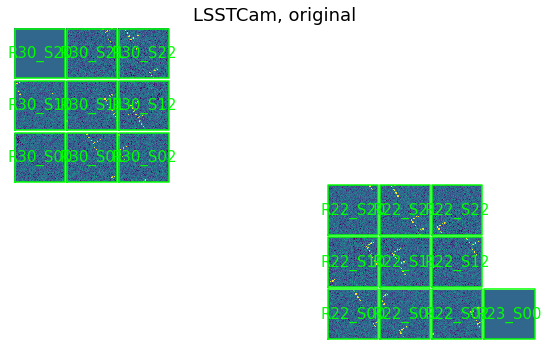

In [21]:
import os
# show the raw image 
from lsst.daf import butler as dafButler
import lsst.afw.cameraGeom.utils as cameraGeomUtils
import lsst.afw.display as afwDisplay

import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval

afwDisplay.setDefaultBackend("matplotlib")
zscale = ZScaleInterval()
repo_dir = os.path.join('/project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot_N/DATA/')

# need to specify the calib collections to be able to access the camera 
instrument = 'LSSTCam'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded']
                         )

dataId0 = dict(instrument=instrument)
dataset = next(iter(
                    butler.registry.queryDatasets(
                        datasetType='postISRCCD', 
                        collections=['run1'],
                        dataId=dataId0  )
                    )
               )

exposure = dataset.dataId["exposure"]

camera  = butler.get("camera", instrument=instrument, exposure=exposure)

fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0., wspace=0.0, )

ax = fig.add_subplot(1, 1, 1)

disp = afwDisplay.Display(fig)
disp.scale('asinh', 'zscale', Q=2)
#disp.scale('linear', 'minmax')
#disp.scale('asinh', 5, 7000, Q=2)

disp.setImageColormap('viridis' if True else 'gray')
dataType = "postISRCCD"


# use that  to limit what's shown
#detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10']# , 'R34_S20'] 

# set to None to plot everything
#detectorNameList = None
# detectorNameList = ['R22_S20', 'R22_S21', 'R22_S22',
#                     'R22_S10', 'R22_S11', 'R22_S12',
#                     'R22_S00', 'R22_S01', 'R22_S02',
#                     'R23_S00'
#                    ]

detectorNameList = ['R30_S20', 'R30_S21', 'R30_S22',
                    'R30_S10', 'R30_S11', 'R30_S12',
                    'R30_S00', 'R30_S01', 'R30_S02',
                    'R22_S20', 'R22_S21', 'R22_S22',
                    'R22_S10', 'R22_S11', 'R22_S12',
                    'R22_S00', 'R22_S01', 'R22_S02',
                    'R23_S00'
                   ]
                    
mos = cameraGeomUtils.showCamera(camera,
                             cameraGeomUtils.ButlerImage(butler, dataType, 
                                                         instrument=instrument, 
                                                         exposure=exposure,
                                                         verbose=True),
                             binSize=16, 
                             detectorNameList=detectorNameList, 
                             display=disp, overlay=True, title=f'{instrument}, original' )
                             
disp.show_colorbar(False)
ax.axis("off")

plt.savefig('LsstCam_letter_R22_R20_euler_serial_remap_rot30_N.png', bbox_inches='tight')


Try reshuffling  the  R22  and R20 - in comCam I did it by hand in `focalplanelayout.txt`,  perhaps I can add that to `update_focalplanelayout_lsst.txt`  , but first do it by hand :
( S21--> S12, S10-->S01 , etc ..) 

Using rotskypos = 0 in the inst file, so that we are not correcting for the rotated sky catalog...

 #### these steps are new
    cd /project/scichris/aos/images/lsstCam/
    mkdir letter_R22_R20_euler_serial_remap_rot_N_shuffle
    mkdir letter_R22_R20_euler_serial_remap_rot_N_shuffle/raw/

    cd letter_R22_R20_euler_serial_remap_rot_N_shuffle

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/R22_R20_letterF_rot_30_N.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot_N_shuffle/raw/ > starPhoSimLetter.log 2>&1



    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot_N_shuffle/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot_N_shuffle/repackaged/ --inst lsst 


    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .

    ./runIsr.sh
    

Reading 123: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 123, exposure: 4016091606002} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].


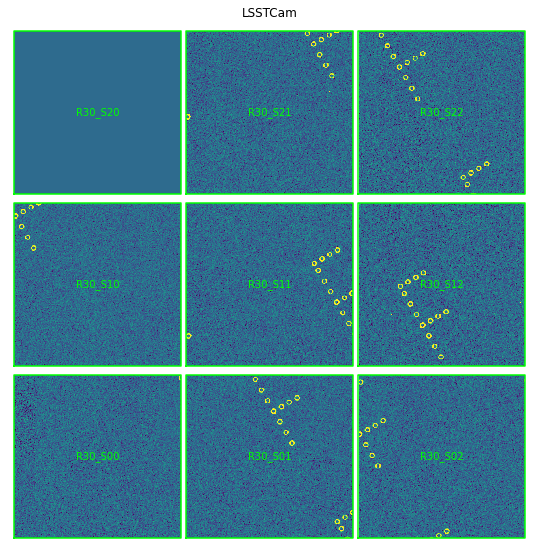

In [1]:
import os
# show the raw image 
from lsst.daf import butler as dafButler
import lsst.afw.cameraGeom.utils as cameraGeomUtils
import lsst.afw.display as afwDisplay

import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval

afwDisplay.setDefaultBackend("matplotlib")
zscale = ZScaleInterval()
repo_dir = os.path.join('/project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot_N_shuffle/DATA/')

# need to specify the calib collections to be able to access the camera 
instrument = 'LSSTCam'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded']
                         )

dataId0 = dict(instrument=instrument)
dataset = next(iter(
                    butler.registry.queryDatasets(
                        datasetType='postISRCCD', 
                        collections=['run1'],
                        dataId=dataId0  )
                    )
               )

exposure = dataset.dataId["exposure"]

camera  = butler.get("camera", instrument=instrument, exposure=exposure)

fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0., wspace=0.0, )

ax = fig.add_subplot(1, 1, 1)

disp = afwDisplay.Display(fig)
disp.scale('asinh', 'zscale', Q=2)
#disp.scale('linear', 'minmax')
#disp.scale('asinh', 5, 7000, Q=2)

disp.setImageColormap('viridis' if True else 'gray')
dataType = "postISRCCD"


# use that  to limit what's shown
#detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10']# , 'R34_S20'] 

# set to None to plot everything
#detectorNameList = None
# detectorNameList = ['R22_S20', 'R22_S21', 'R22_S22',
#                     'R22_S10', 'R22_S11', 'R22_S12',
#                     'R22_S00', 'R22_S01', 'R22_S02',
#                     'R23_S00'
#                    ]

# detectorNameList = ['R22_S20', 'R22_S21', 'R22_S22',
#                     'R22_S10', 'R22_S11', 'R22_S12',
#                     'R22_S00', 'R22_S01', 'R22_S02',
#                    ]
                    
detectorNameList = ['R30_S20', 'R30_S21', 'R30_S22',
                    'R30_S10', 'R30_S11', 'R30_S12',
                    'R30_S00', 'R30_S01', 'R30_S02',
                   ]    
    
mos = cameraGeomUtils.showCamera(camera,
                             cameraGeomUtils.ButlerImage(butler, dataType, 
                                                         instrument=instrument, 
                                                         exposure=exposure,
                                                         verbose=True),
                             binSize=16, 
                             detectorNameList=detectorNameList, 
                             display=disp, overlay=True, title=f'{instrument}' )
                             
disp.show_colorbar(False)
ax.axis("off")

plt.savefig('LsstCam_letter_R22_R20_euler_serial_remap_rot30_N_shuffle.png', bbox_inches='tight')


I reshuffled by hand R22 and R20, but the stars are actually at R30. So need to reshuffle that too and rerun : 
    
    
     #### these steps are new
    cd /project/scichris/aos/images/lsstCam/
    mkdir letter_R22_R20_euler_serial_remap_rot_N_shuffle2
    mkdir letter_R22_R20_euler_serial_remap_rot_N_shuffle2/raw/

    cd letter_R22_R20_euler_serial_remap_rot_N_shuffle2

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/R22_R20_letterF_rot_30_N.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot_N_shuffle2/raw/ > starPhoSimLetter.log 2>&1


    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot_N_shuffle2/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot_N_shuffle2/repackaged/ --inst lsst 


    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .

    ./runIsr.sh

Reading 119: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 119, exposure: 4016091606002} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].


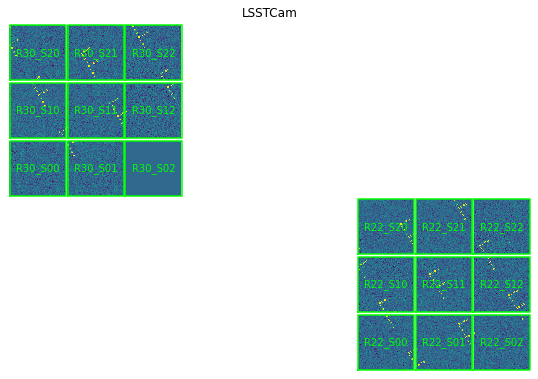

In [17]:
import os
# show the raw image 
from lsst.daf import butler as dafButler
import lsst.afw.cameraGeom.utils as cameraGeomUtils
import lsst.afw.display as afwDisplay

import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval

afwDisplay.setDefaultBackend("matplotlib")
zscale = ZScaleInterval()
repo_dir = os.path.join('/project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot_N_shuffle2/DATA/')

# need to specify the calib collections to be able to access the camera 
instrument = 'LSSTCam'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded']
                         )

dataId0 = dict(instrument=instrument)
dataset = next(iter(
                    butler.registry.queryDatasets(
                        datasetType='postISRCCD', 
                        collections=['run1'],
                        dataId=dataId0  )
                    )
               )

exposure = dataset.dataId["exposure"]

camera  = butler.get("camera", instrument=instrument, exposure=exposure)

fig = plt.figure(figsize=(10,10))
fig.subplots_adjust(hspace=0., wspace=0.0, )

ax = fig.add_subplot(1, 1, 1)

disp = afwDisplay.Display(fig)
disp.scale('asinh', 'zscale', Q=2)
#disp.scale('linear', 'minmax')
#disp.scale('asinh', 5, 7000, Q=2)

disp.setImageColormap('viridis' if True else 'gray')
dataType = "postISRCCD"


# use that  to limit what's shown
#detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10']# , 'R34_S20'] 

# set to None to plot everything
#detectorNameList = None
# detectorNameList = ['R22_S20', 'R22_S21', 'R22_S22',
#                     'R22_S10', 'R22_S11', 'R22_S12',
#                     'R22_S00', 'R22_S01', 'R22_S02',
#                     'R23_S00'
#                    ]

# detectorNameList = ['R22_S20', 'R22_S21', 'R22_S22',
#                     'R22_S10', 'R22_S11', 'R22_S12',
#                     'R22_S00', 'R22_S01', 'R22_S02',
#                    ]
                    
detectorNameList = [
                    'R22_S20', 'R22_S21', 'R22_S22',
                    'R22_S10', 'R22_S11', 'R22_S12',
                    'R22_S00', 'R22_S01', 'R22_S02',

                    'R30_S20', 'R30_S21', 'R30_S22',
                    'R30_S10', 'R30_S11', 'R30_S12',
                    'R30_S00', 'R30_S01', 'R30_S02',
                   ]    
    
mos = cameraGeomUtils.showCamera(camera,
                             cameraGeomUtils.ButlerImage(butler, dataType, 
                                                         instrument=instrument, 
                                                         exposure=exposure,
                                                         verbose=True),
                             binSize=16, 
                             detectorNameList=detectorNameList, 
                             display=disp, overlay=True, title=f'{instrument}' )
                             
disp.show_colorbar(False)
ax.axis("off")

plt.savefig('LsstCam_letter_R22_R20_euler_serial_remap_rot30_N_shuffle2.png', bbox_inches='tight')


Ok so the above shows that it works fine (as expected), but we would need to reshuffle all sensors within each raft. Do that with a code in `focalplanelayout.txt`:




In [15]:
newName = 'R02_S10'
raftName, sensorName = newName.split('_')
sensorNameMap = {'S01':'S10',
                     'S02':'S20',
                     'S12':'S21',
                     'S21':'S12',
                     'S10':'S01',
                     'S20':'S02'
                    }

newSensorName = sensorNameMap[sensorName]

updatedName = f'{raftName}_{newSensorName}'

In [20]:
'S01' in sensorNameMap.keys()

True


   #### these steps were already done for the image above with rotated R22 F letter
    python /home/scichris/notebooks/update_focalplanelayout_lsst.py   update_euler = True as +90
    reshuffle_sensors = True
    
    cd /project/scichris/aos/phosim_syseng4/data/lsst
    cp focalplanelayout_DM-30367.txt focalplanelayout.txt 
    
    
    #### these steps are new
    cd /project/scichris/aos/images/lsstCam/
    mkdir letter_R22_R20_euler_serial_remap_rot_N_shuffle3
    mkdir letter_R22_R20_euler_serial_remap_rot_N_shuffle3/raw/

    cd letter_R22_R20_euler_serial_remap_rot_N_shuffle3

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/R22_R20_letterF_rot_30_N.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot_N_shuffle3/raw/ > starPhoSimLetter.log 2>&1


    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot_N_shuffle3/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot_N_shuffle3/repackaged/ --inst lsst 


    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .

    ./runIsr.sh

Reading 119: Dataset postISRCCD with data ID {instrument: 'LSSTCam', detector: 119, exposure: 4016091606002} could not be found in collections [LSSTCam/raw/all, LSSTCam/calib, run1, LSSTCam/calib/unbounded].


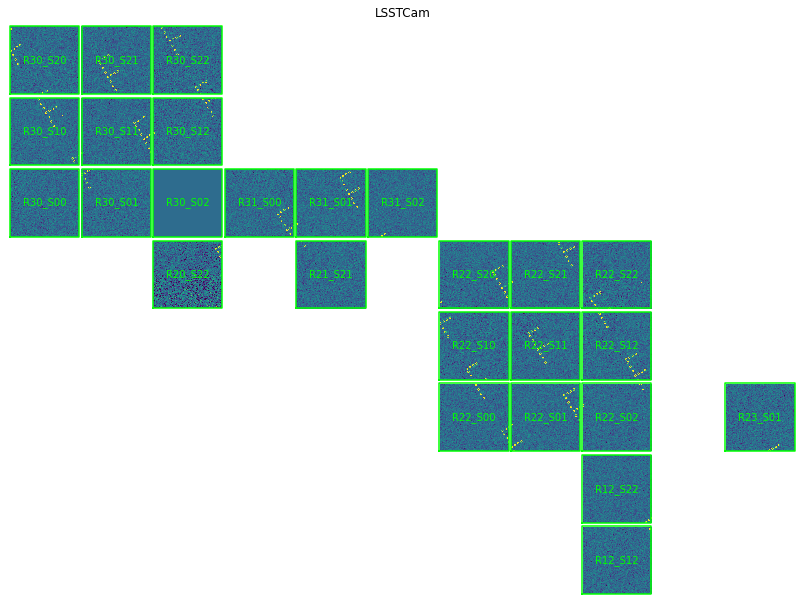

In [27]:
import os
# show the raw image 
from lsst.daf import butler as dafButler
import lsst.afw.cameraGeom.utils as cameraGeomUtils
import lsst.afw.display as afwDisplay

import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval

afwDisplay.setDefaultBackend("matplotlib")
zscale = ZScaleInterval()
repo_dir = os.path.join('/project/scichris/aos/images/lsstCam/letter_R22_R20_euler_serial_remap_rot_N_shuffle3/DATA/')

# need to specify the calib collections to be able to access the camera 
instrument = 'LSSTCam'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded']
                         )

dataId0 = dict(instrument=instrument)
dataset = next(iter(
                    butler.registry.queryDatasets(
                        datasetType='postISRCCD', 
                        collections=['run1'],
                        dataId=dataId0  )
                    )
               )

exposure = dataset.dataId["exposure"]

camera  = butler.get("camera", instrument=instrument, exposure=exposure)

fig = plt.figure(figsize=(15,15))
fig.subplots_adjust(hspace=0., wspace=0.0, )

ax = fig.add_subplot(1, 1, 1)

disp = afwDisplay.Display(fig)
disp.scale('asinh', 'zscale', Q=2)
#disp.scale('linear', 'minmax')
#disp.scale('asinh', 5, 7000, Q=2)

disp.setImageColormap('viridis' if True else 'gray')
dataType = "postISRCCD"


# use that  to limit what's shown
#detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10']# , 'R34_S20'] 

# set to None to plot everything
#detectorNameList = None
# detectorNameList = ['R22_S20', 'R22_S21', 'R22_S22',
#                     'R22_S10', 'R22_S11', 'R22_S12',
#                     'R22_S00', 'R22_S01', 'R22_S02',
#                     'R23_S00'
#                    ]

# detectorNameList = ['R22_S20', 'R22_S21', 'R22_S22',
#                     'R22_S10', 'R22_S11', 'R22_S12',
#                     'R22_S00', 'R22_S01', 'R22_S02',
#                    ]
                    
detectorNameList = ['R12_S12','R12_S22',
                    'R20_S22',
                    'R21_S21',
                    'R22_S20', 'R22_S21', 'R22_S22',
                    'R22_S10', 'R22_S11', 'R22_S12',
                    'R22_S00', 'R22_S01', 'R22_S02',
                    'R23_S01',
                    'R30_S20', 'R30_S21', 'R30_S22',
                    'R30_S10', 'R30_S11', 'R30_S12',
                    'R30_S00', 'R30_S01', 'R30_S02',
                    'R31_S00','R31_S01', 'R31_S02'
                   ]    
    
mos = cameraGeomUtils.showCamera(camera,
                             cameraGeomUtils.ButlerImage(butler, dataType, 
                                                         instrument=instrument, 
                                                         exposure=exposure,
                                                         verbose=True),
                             binSize=16, 
                             detectorNameList=detectorNameList, 
                             display=disp, overlay=True, title=f'{instrument}' )
                             
disp.show_colorbar(False)
ax.axis("off")

plt.savefig('LsstCam_letter_R22_R20_euler_serial_remap_rot30_N_shuffle3.png', bbox_inches='tight',
           dpi=150)


Have a look at what this would look like without all the changes:
    
    
    # do these steps to get to how it was before any changes were put in place
    
    python /home/scichris/notebooks/update_segmentation_lsst.py   change_serial = False  (using -1 multiplication)
                                                                  remap_channels = False 
    cd /project/scichris/aos/phosim_syseng4/data/lsst
    cp segmentation_DM-28557.txt segmentation.txt  
    
    
    python /home/scichris/notebooks/update_focalplanelayout_lsst.py   update_euler = False 
    reshuffle_sensors = False
    
    cd /project/scichris/aos/phosim_syseng4/data/lsst
    cp focalplanelayout_DM-28557.txt focalplanelayout.txt 
    
    
    #### these steps are new
    cd /project/scichris/aos/images/lsstCam/
    mkdir letter_R22_R20_rot
    mkdir letter_R22_R20_rot/raw/

    cd letter_R22_R20_rot

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/R22_R20_letterF_rot_30_N.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/lsstCam/letter_R22_R20_rot/raw/ > starPhoSimLetter.log 2>&1


    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_R22_R20_rot/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_R22_R20_rot/repackaged/ --inst lsst 


    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .

    ./runIsr.sh

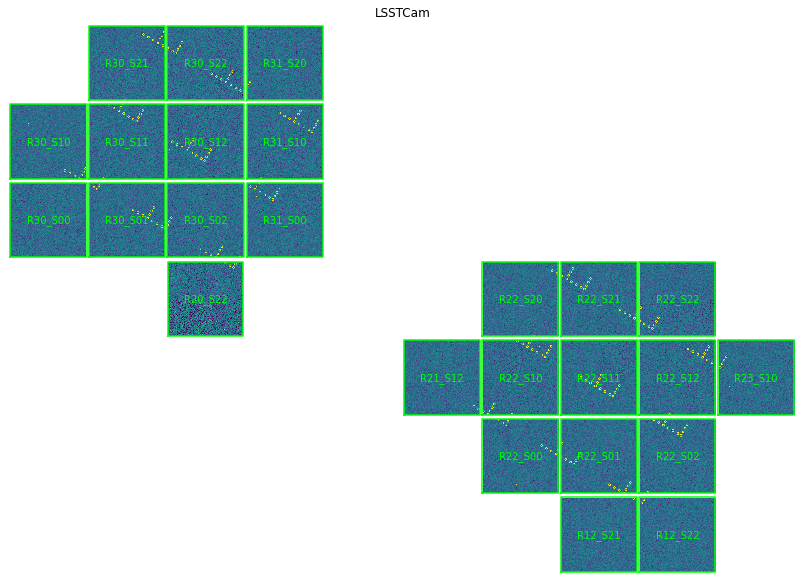

In [2]:
import os
# show the raw image 
from lsst.daf import butler as dafButler
import lsst.afw.cameraGeom.utils as cameraGeomUtils
import lsst.afw.display as afwDisplay

import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval

afwDisplay.setDefaultBackend("matplotlib")
zscale = ZScaleInterval()
repo_dir = os.path.join('/project/scichris/aos/images/lsstCam/letter_R22_R20_rot/DATA/')

# need to specify the calib collections to be able to access the camera 
instrument = 'LSSTCam'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded']
                         )

dataId0 = dict(instrument=instrument)
dataset = next(iter(
                    butler.registry.queryDatasets(
                        datasetType='postISRCCD', 
                        collections=['run1'],
                        dataId=dataId0  )
                    )
               )

exposure = dataset.dataId["exposure"]

camera  = butler.get("camera", instrument=instrument, exposure=exposure)

fig = plt.figure(figsize=(15,15))
fig.subplots_adjust(hspace=0., wspace=0.0, )

ax = fig.add_subplot(1, 1, 1)

disp = afwDisplay.Display(fig)
disp.scale('asinh', 'zscale', Q=2)
#disp.scale('linear', 'minmax')
#disp.scale('asinh', 5, 7000, Q=2)

disp.setImageColormap('viridis' if True else 'gray')
dataType = "postISRCCD"


# use that  to limit what's shown
#detectorNameList = ['R22_S11', 'R22_S20', 'R22_S10']# , 'R34_S20'] 

# set to None to plot everything
#detectorNameList = None
# detectorNameList = ['R22_S20', 'R22_S21', 'R22_S22',
#                     'R22_S10', 'R22_S11', 'R22_S12',
#                     'R22_S00', 'R22_S01', 'R22_S02',
#                     'R23_S00'
#                    ]

# detectorNameList = ['R22_S20', 'R22_S21', 'R22_S22',
#                     'R22_S10', 'R22_S11', 'R22_S12',
#                     'R22_S00', 'R22_S01', 'R22_S02',
#                    ]
                    
detectorNameList = ['R12_S21','R12_S22',
                    'R20_S22',
                    'R21_S12',
                    'R22_S20', 'R22_S21', 'R22_S22',
                    'R22_S10', 'R22_S11', 'R22_S12',
                    'R22_S00', 'R22_S01', 'R22_S02',
                    'R23_S10',
                               'R30_S21', 'R30_S22',
                    'R30_S10', 'R30_S11', 'R30_S12',
                    'R30_S00', 'R30_S01', 'R30_S02',
                    'R31_S00','R31_S10', 'R31_S20'
                   ]    
    
mos = cameraGeomUtils.showCamera(camera,
                             cameraGeomUtils.ButlerImage(butler, dataType, 
                                                         instrument=instrument, 
                                                         exposure=exposure,
                                                         verbose=True),
                             binSize=16, 
                             detectorNameList=detectorNameList, 
                             display=disp, overlay=True, title=f'{instrument}' )
                             
disp.show_colorbar(False)
ax.axis("off")

plt.savefig('LsstCam_letter_R22_R20_rot_orig_cameraGeom.png', bbox_inches='tight', dpi=150)


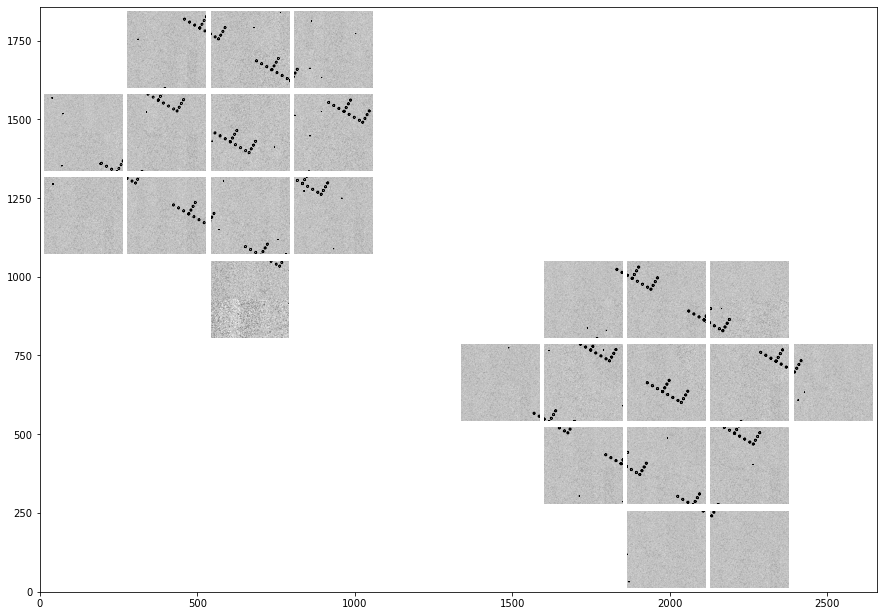

In [8]:
fig,ax = plt.subplots(1,1,figsize=(15,15))
zscale = ZScaleInterval()
vmin, vmax = zscale.get_limits(mos.array)
ax.imshow(mos.array , cmap='Greys', origin='lower', vmin=vmin,vmax=vmax)


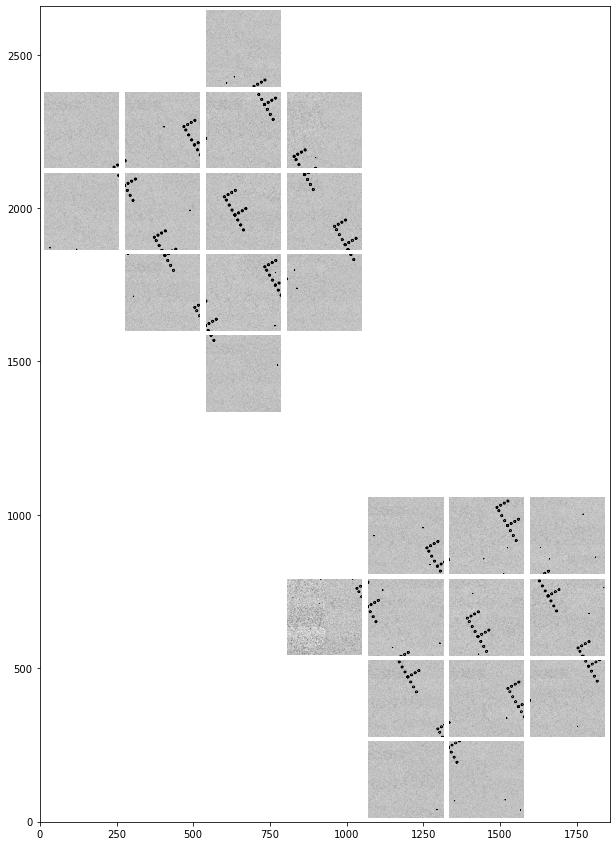

In [6]:
fig,ax = plt.subplots(1,1,figsize=(15,15))
zscale = ZScaleInterval()
vmin, vmax = zscale.get_limits(mos.array)
ax.imshow(mos.array.T , cmap='Greys', origin='lower', vmin=vmin,vmax=vmax)
#ax.axis("off")

plt.savefig("LsstCam_letter_R22_R20_rot_orig_mosaic.png",dpi=150)

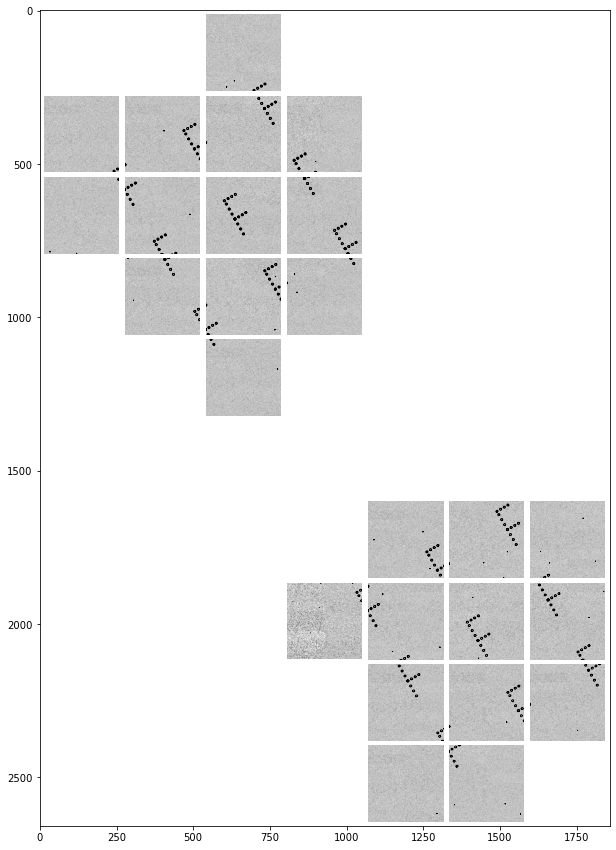

In [7]:
import numpy as np
fig,ax = plt.subplots(1,1,figsize=(15,15))
zscale = ZScaleInterval()
vmin, vmax = zscale.get_limits(mos.array)
ax.imshow(np.rot90(mos.array), cmap='Greys', vmin=vmin,vmax=vmax)
#ax.axis("off")

plt.savefig("LsstCam_letter_R22_R20_rot_orig_mosaic_flip90.png",dpi=150)

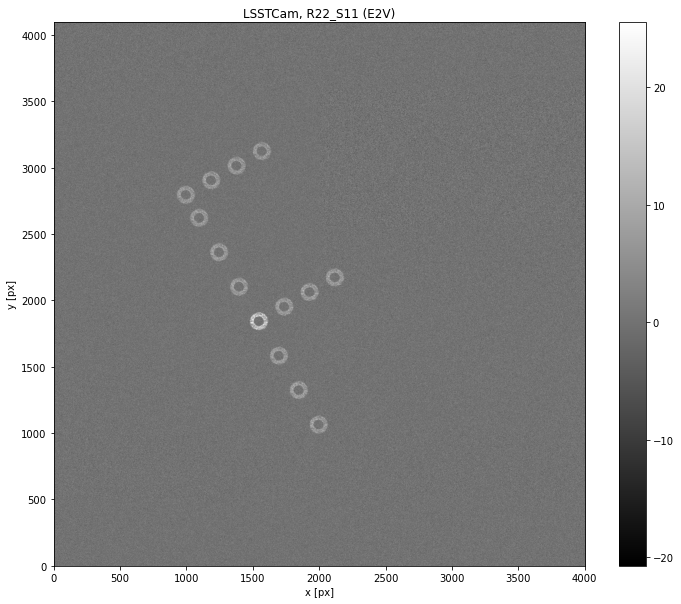

In [2]:
# show the raw image 
from lsst.daf import butler as dafButler
import matplotlib.pyplot as plt
from matplotlib import rcParams 
from astropy.io import fits
from astropy.visualization import ZScaleInterval
zscale = ZScaleInterval()

instrument = 'LSSTCam'
repo_dir = '/project/scichris/aos/images/lsstCam/letter_R22_R20_rot/DATA/'
butler = dafButler.Butler(repo_dir, collections=[f'{instrument}/raw/all',
                                                 f'{instrument}/calib','run1',
                                                 f'{instrument}/calib/unbounded'],
                             )
        
dataId0 = dict(instrument=instrument)
dataset = next(iter(butler.registry.queryDatasets(
                    datasetType='raw',
                    dataId=dataId0  )))

expN = dataset.dataId["exposure"]

exposure = butler.get('postISRCCD', detector='R22_S11', 
                      instrument=instrument,exposure=expN,
          collections=['run1'])
detector  = exposure.getDetector()
data = exposure.image.array

vmin, vmax = zscale.get_limits(data)

fig = plt.figure(figsize=(12, 10))
plt.imshow(data.T, origin='lower',
           vmin=vmin,vmax=vmax,cmap='gray')
plt.colorbar()
plt.xlabel('x [px]')
plt.ylabel('y [px]')
detectorName, detectorType = detector.getName(), detector.getSerial()[:3] 
plt.title(f'{instrument}, {detectorName} ({detectorType})')
plt.savefig(f'{instrument}_letter_{detectorName}_{detectorType}_orig_rot.png', bbox_inches='tight')

d)  Try changing the Euler angle in focalplanelayout as +90, serial direction in segmentation, remap channels in segmentation (option d). `R22_S11` should have the correct orientation, but there may still be issues with the sensor ordering in  cameraGeomUtils...


    python /home/scichris/notebooks/update_focalplanelayout_lsst.py  with update_euler = True  as +90 

    cd /project/scichris/aos/phosim_syseng4/data/lsst
    cp focalplanelayout_DM-30367.txt focalplanelayout.txt 

    cd /project/scichris/aos/images/lsstCam/
    mkdir letter_b_euler_rot1
    mkdir letter_b_euler_rot1/raw/

    cd letter_b_euler_rot1

    python /project/scichris/aos/phosim_syseng4/phosim.py /project/scichris/aos/images/lsstCam/R22_letterF_30deg_rot.inst -i lsst -e 1 -c /project/scichris/aos/images/lsstCam/noBkgnd.cmd -p 25 -o /project/scichris/aos/images/lsstCam/letter_b_euler_rot1/raw/ > starPhoSimLetter.log 2>&1

    phosim_repackager.py /project/scichris/aos/images/lsstCam/letter_b_euler_rot1/raw/ --out_dir /project/scichris/aos/images/lsstCam/letter_b_euler_rot1/repackaged/ --inst lsst 


    cp ../letter_R22/runIsr.sh .
    cp ../letter_R22/testPipeline.yaml .

    ./runIsr.sh


In [2]:
bbox = lsstDetectors.getBBox()
px_y = bbox.getDimensions()[0]
px_x = bbox.getDimensions()[1]
print(px_x, px_y)

4000 4072


In [3]:
bbox.getDimensions()

Extent2I(4072, 4000)

In [4]:
bbox.getMinX()

0

In [5]:
bbox.getMaxX()

4071

In [11]:
amp = lsstDetectors[0]

bbox = amp.getRawSerialPrescanBBox()
print(bbox.getWidth(), bbox.getHeight())

3 2000


In [10]:
bbox = amp.getRawSerialOverscanBBox()
print(bbox.getWidth(), bbox.getHeight())

32 2000


In [12]:
bbox = amp.getRawParallelOverscanBBox()
print(bbox.getWidth(), bbox.getHeight())

509 48


In [13]:
A = bbox.getWidth()
B = '0'

bbox = amp.getRawParallelOverscanBBox()
C = bbox.getHeight()

bbox = amp.getRawSerialOverscanBBox()
D = bbox.getWidth()

In [14]:
str(B)

'0'

In [15]:
str(A)

'509'